#### On Colored images: SGD Classifier & Random Forest

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# !unzip "/content/drive/MyDrive/Dataset/leaves_SVM/preds2.zip" -d "/content/drive/MyDrive/Dataset/leaves_SVM"

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
# Load plant images
path = "/content/drive/MyDrive/Dataset/dataset750/"
plant_images = []
for i in range(1, 751):
  img = cv2.imread(path + "plant/plant ({0}).JPG".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  plant_images.append(img)

# Load non-plant images
non_plant_images = []
for i in range(1, 701):
  img = cv2.imread(path + "non_plant/not_leaf ({0}).jpg".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  non_plant_images.append(img)

In [ ]:
X = plant_images + non_plant_images
X = np.array(X)

In [ ]:
y_plant = [1] * len(plant_images)
y_non_plant = [0] * len(non_plant_images)
y = y_plant + y_non_plant
y = np.array(y)
y = y.astype(np.uint8)

In [ ]:
len(y)

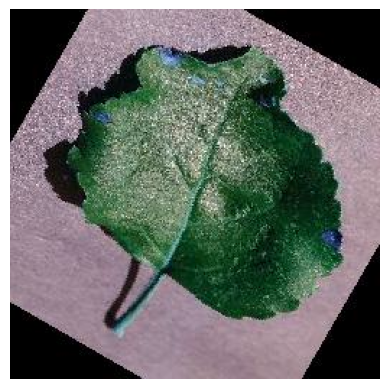

1


In [ ]:
some_pic = X[0]

plt.imshow(some_pic, cmap='binary')
plt.axis('off')
plt.show()

print(y[0])

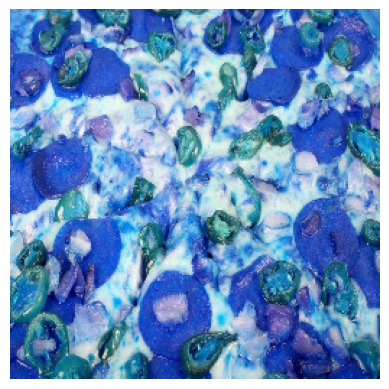

0


In [ ]:
some_pic2 = X[761]

plt.imshow(some_pic2, cmap='binary')
plt.axis('off')
plt.show()

print(y[761])

In [ ]:
len(plant_images), len(non_plant_images)

(750, 700)

In [ ]:
len(X)

1450

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
len(plant_images), len(plant_images[0]), len(plant_images[0][0]), len(plant_images[0][0][0])

(750, 256, 256, 3)

In [ ]:
x_train = np.reshape(x_train, (len(x_train), -1))
x_train.shape

(971, 196608)

In [ ]:
x_test = np.reshape(x_test, (len(x_test), -1))
x_test.shape

(479, 196608)

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(random_state=42)
sgd_clf.fit(x_train, y_train)

SGDClassifier(random_state=42)

In [ ]:
some_pic.shape, type(some_pic)

((256, 256, 3), numpy.ndarray)

In [ ]:
some_pic_reshaped = some_pic.reshape((1, -1))
some_pic_reshaped.shape

(1, 196608)

In [ ]:
sgd_clf.predict(some_pic_reshaped)

array([1], dtype=uint8)

Custom cross-validation

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.base import clone

skfolds = StratifiedKFold(n_splits=3, random_state=42, shuffle=True)

# 3 folds --> 3 iterations
for i, (train_index, test_index) in enumerate(skfolds.split(x_train, y_train)):
  clone_clf = clone(sgd_clf)  # clone the trained model
  X_train_folds = x_train[train_index]
  y_train_folds = y_train[train_index]
  X_test_fold = x_train[test_index]
  y_test_fold = y_train[test_index]

  clone_clf.fit(X_train_folds, y_train_folds)
  y_pred = clone_clf.predict(X_test_fold)
  n_correct = sum(y_pred == y_test_fold)
  print("Accuracy - Fold {0}: ".format(i), "{:.2f} %".format(n_correct / len(y_pred) * 100))
  # print(n_correct / len(y_pred)) # accuracy %age

Accuracy - Fold 0:  93.52 %
Accuracy - Fold 1:  94.14 %
Accuracy - Fold 2:  88.85 %


In [ ]:
skfolds

StratifiedKFold(n_splits=3, random_state=42, shuffle=True)

In-built Cross-Validation from Sk-Learn

In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_score(sgd_clf, x_train, y_train, cv=3, scoring='accuracy')

array([0.92283951, 0.91358025, 0.91950464])

Note:  accuracy is generally not the preferred performance measure for classifiers, especially when we are dealing with skewed datasets (i.e., when some classes are much more frequent than others)

Eg - In a dataset of 100 images, containing 95 plant images, the model is 95% accurate in predicting the plant when it predicts ONLY plants

Much better approach - Confusion Matrix

Confusion Matrix

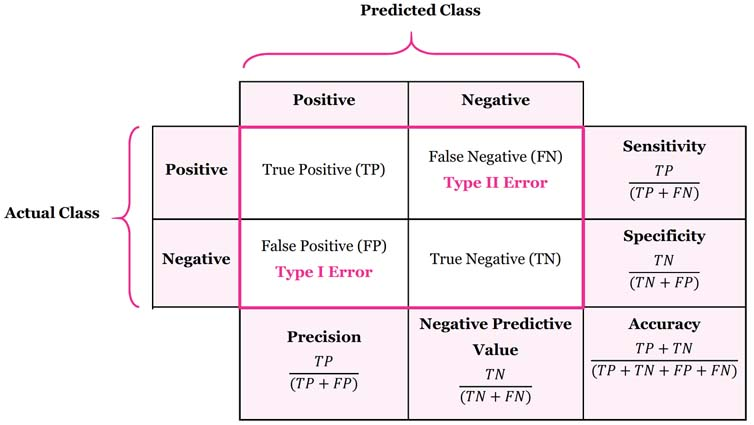

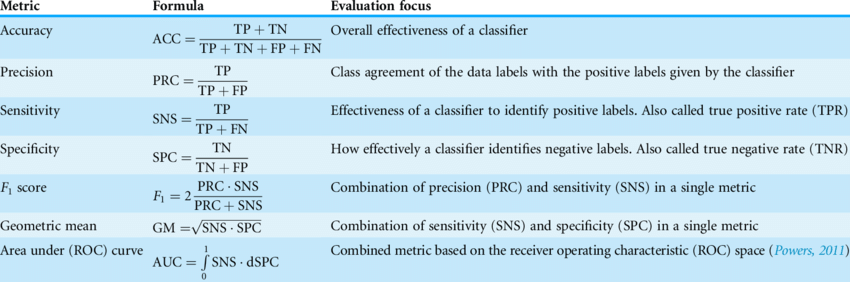

In [ ]:
from sklearn.model_selection import cross_val_predict

# sklearn predefined cross-validation
y_train_pred = cross_val_predict(sgd_clf, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_train, y_train_pred)

array([[433,  39],
       [ 40, 459]])

In [ ]:
y_train_perfect_predictions = y_train

confusion_matrix(y_train, y_train_perfect_predictions)

array([[472,   0],
       [  0, 499]])

In [ ]:

# confusion_matrix(y_test, y_test_pred)

The F1 score favors classifiers that have similar precision and recall

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.9216867469879518
Recall score:  0.9198396793587175
F1 score:  0.9207622868605817


F1 score on the validation dataset

In [ ]:
y_test_pred = cross_val_predict(sgd_clf, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.9097744360902256
Recall score:  0.9641434262948207
F1 score:  0.9361702127659575


Scikit-Learn does not let you set the threshold directly, but it does give you access to the decision scores that it uses to make predictions. Instead of calling the classifier’s predict() method, you can call its decision_function() method, which returns a score for each instance, and then use any
threshold you want to make predictions based on those scores

In [ ]:
y_scores = sgd_clf.decision_function(some_pic_reshaped)
y_scores  # the decision score of the input

array([3.28840152e+09])

The SGDClassifier uses a threshold equal to 0, so the below code returns the same result as the predict() method (i.e., True).

In [ ]:
threshold = 0

# doubt
y_some_image_pred = (y_scores > threshold)
y_some_image_pred

array([ True])

In [ ]:
y_scores[0]

3288401519.724075

In [ ]:
threshold = 3.3e+09
y_some_digit_pred = (y_scores > threshold)
y_some_digit_pred

array([False])

Precision & Recall VS decision threshold

In [ ]:
y_scores = cross_val_predict(sgd_clf, x_train, y_train, cv=3, method='decision_function')

In [ ]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)

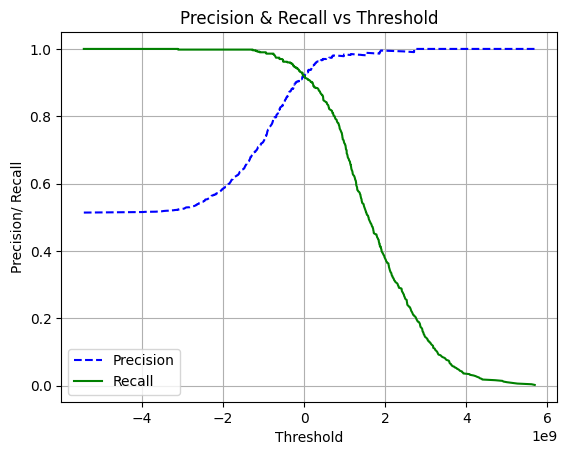

In [ ]:
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
  plt.plot(thresholds, precisions[:-1], "b--", label='Precision')
  plt.plot(thresholds, recalls[:-1], "g-", label='Recall')
  plt.title('Precision & Recall vs Threshold')
  plt.xlabel("Threshold")
  plt.ylabel("Precision/ Recall")
  plt.legend()
  plt.grid()

plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

Precision VS Recall

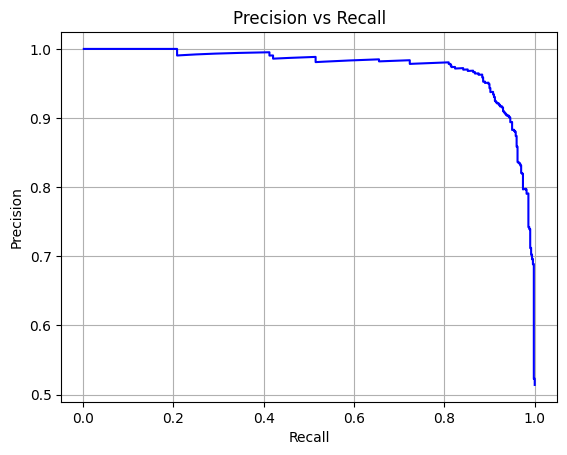

In [ ]:
def plot_precision_vs_recall(precisions, recalls):
  plt.plot(recalls[:-1], precisions[:-1], "b-")
  plt.title('Precision vs Recall')
  plt.xlabel("Recall")
  plt.ylabel("Precision")
  plt.grid()

plot_precision_vs_recall(precisions, recalls)
plt.show()

Suppose you decide to aim for 95% precision. You look up the first plot to find the corresponding threshold value.

To be more precise you can search for the lowest threshold that gives you at least 95% precision (np.argmax() will give you the first index of the maximum value.

(Showing a negative threshold value for 90% precision)

In [ ]:
threshold_93_precision = thresholds[np.argmax(precisions >= 0.93)]
threshold_93_precision

72159898.80541158

In [ ]:
# for all the predictions in which the scores >= threshold at 93% precision
y_train_pred_93 = (y_scores >= threshold_93_precision)

In [ ]:
precision_score(y_train, y_train_pred_93)

0.9304703476482618

In [ ]:
recall_score(y_train, y_train_pred_93)

0.9118236472945892

ROC Curve

In [ ]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_train, y_scores)

The dotted line represents the ROC curve of a purely random classifier; a good
classifier stays as far away from that line as possible (toward the top-left corner).

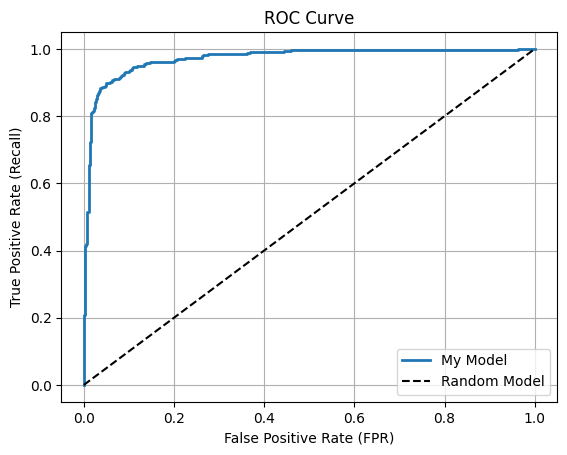

In [ ]:
def plot_roc_curve(fpr, tpr, label=None):
  plt.plot(fpr, tpr, linewidth=2, label=label)
  plt.plot([0,1], [0,1], 'k--', label='Random Model') # Dashed diagonal
  plt.legend()
  plt.title('ROC Curve')
  plt.xlabel("False Positive Rate (FPR)")
  plt.ylabel("True Positive Rate (Recall)")
  plt.grid()

plot_roc_curve(fpr, tpr, label='My Model')
plt.show()

One way to compare classifiers is to measure the area under the curve (AUC).

A perfect classifier will have a ROC AUC equal to 1, whereas a purely random classifier will have a ROC AUC equal to 0.5

In [ ]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_train, y_scores)

0.9733534866342856

Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

forest_clf = RandomForestClassifier(random_state=42)
y_probas_forest = cross_val_predict(forest_clf, x_train, y_train,
                                    cv=3, method='predict_proba')

In [ ]:
# index 0 - negative class,
# index 1 - positive class

y_probas_forest[:5]

array([[0.78, 0.22],
       [0.26, 0.74],
       [0.14, 0.86],
       [0.09, 0.91],
       [0.64, 0.36]])

The roc_curve() function expects labels and scores, but instead of scores you can give it class probabilities

Let’s use the positive class’s probability as the score

In [ ]:
y_scores_forest = y_probas_forest[:, 1]  # score = proba of positive class
fpr_forest, tpr_forest, thresholds_forest = roc_curve(y_train, y_scores_forest)

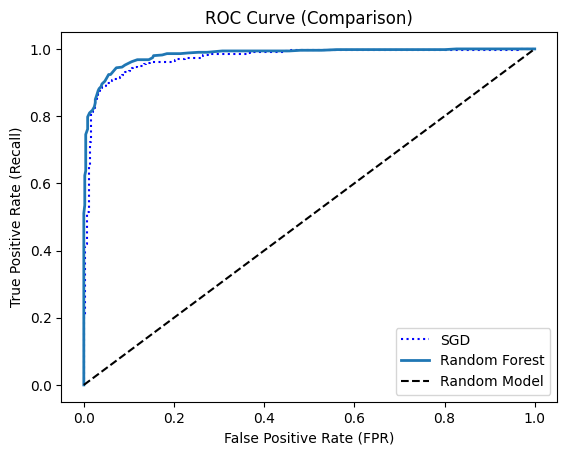

In [ ]:
plt.plot(fpr, tpr, 'b:', label='SGD')
plot_roc_curve(fpr_forest, tpr_forest, 'Random Forest')
plt.legend(loc='lower right')
plt.title('ROC Curve (Comparison)')
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (Recall)")
plt.grid()

plt.show()

In [ ]:
roc_auc_score(y_train, y_scores_forest)

0.9827387826500458

Performance metrics of the Random Forest classifier

In [ ]:
cross_val_score(forest_clf, x_train, y_train, cv=3, scoring='accuracy')

array([0.94444444, 0.92592593, 0.92569659])

In [ ]:
from sklearn.model_selection import cross_val_predict

y_train_pred = cross_val_predict(forest_clf, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train, y_train_pred)

array([[444,  28],
       [ 38, 461]])

In [ ]:
y_train_perfect_predictions = y_train
confusion_matrix(y_train, y_train_perfect_predictions)

array([[472,   0],
       [  0, 499]])

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.9427402862985685
Recall score:  0.9238476953907816
F1 score:  0.9331983805668016


Predictions

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = [cv2.resize(img, (256, 256))]

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
print("-------STOCHASTIC GRADIENT MODEL-------:\n")
predict_func(sgd_clf)

In [ ]:
forest_clf.fit(x_train, y_train)

print("-------RANDOM FOREST MODEL-------:\n")
predict_func(forest_clf)

Save the models

In [ ]:
# import pickle

# path_model = "/content/drive/MyDrive/Dataset/leaves_SVM/"

In [ ]:
# # save the SGD model to disk
# filename = 'sgd_model.sav'
# pickle.dump(sgd_clf, open(path_model + filename, 'wb'))

# # save the Random forest model to disk
# filename = 'forest_model.sav'
# pickle.dump(forest_clf, open(path_model + filename, 'wb'))

#### On grayscale images: SGD Classifier & Random Forest

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
# Load plant images
path = "/content/drive/MyDrive/Dataset/dataset750/"
plant_images = []
for i in range(1, 751):
  img = cv2.imread(path + "plant/plant ({0}).JPG".format(i), cv2.IMREAD_GRAYSCALE)
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  plant_images.append(img)

# Load non-plant images
non_plant_images = []
for i in range(1, 701):
  img = cv2.imread(path + "non_plant/not_leaf ({0}).jpg".format(i), cv2.IMREAD_GRAYSCALE)
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  non_plant_images.append(img)

In [ ]:
X = plant_images + non_plant_images
X = np.array(X)

In [ ]:
X.shape

(1450, 256, 256)

In [ ]:
y_plant = [1] * len(plant_images)
y_non_plant = [0] * len(non_plant_images)
y = y_plant + y_non_plant
y = np.array(y)
y = y.astype(np.uint8)

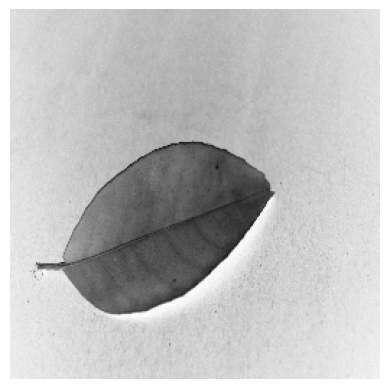

1


In [ ]:
some_pic = X[1]

plt.imshow(some_pic, cmap='binary')
plt.axis('off')
plt.show()

print(y[1])

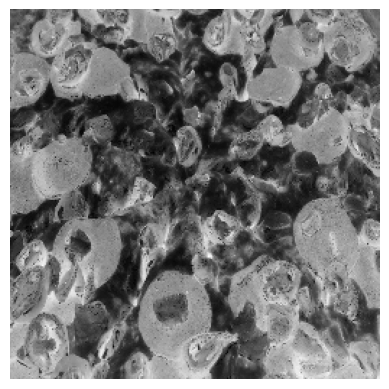

0


In [ ]:
some_pic2 = X[761]

plt.imshow(some_pic2, cmap='binary')
plt.axis('off')
plt.show()

print(y[761])

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
len(plant_images), len(plant_images[0]), len(plant_images[0][0])

(750, 256, 256)

In [ ]:
x_train = np.reshape(x_train, (len(x_train), -1))
x_train.shape

(971, 65536)

In [ ]:
x_test = np.reshape(x_test, (len(x_test), -1))
x_test.shape

(479, 65536)

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd_clf_gray = SGDClassifier(random_state=42)
sgd_clf_gray.fit(x_train, y_train)

SGDClassifier(random_state=42)

In [ ]:
some_pic.shape, type(some_pic)

((256, 256), numpy.ndarray)

In [ ]:
some_pic_reshaped = some_pic.reshape((1, -1))
some_pic_reshaped.shape

(1, 65536)

In [ ]:
sgd_clf_gray.predict(some_pic_reshaped)

array([1], dtype=uint8)

Cross-validation

In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_score(sgd_clf_gray, x_train, y_train, cv=3, scoring='accuracy')

array([0.63888889, 0.72530864, 0.61609907])

Confusion Matrix

In [ ]:
from sklearn.model_selection import cross_val_predict

# sklearn predefined cross-validation
y_train_pred = cross_val_predict(sgd_clf_gray, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_train, y_train_pred)

array([[293, 179],
       [151, 348]])

In [ ]:
y_train_perfect_predictions = y_train

confusion_matrix(y_train, y_train_perfect_predictions)

array([[472,   0],
       [  0, 499]])

F1 score on training dataset

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.6603415559772297
Recall score:  0.6973947895791583
F1 score:  0.6783625730994152


F1 score on test dataset

In [ ]:
y_test_pred = cross_val_predict(sgd_clf_gray, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.6735294117647059
Recall score:  0.9123505976095617
F1 score:  0.7749576988155669


In [ ]:
y_scores = sgd_clf_gray.decision_function(some_pic_reshaped)
y_scores  # the decision score of the input

array([8302166.20002061])

In [ ]:
threshold = 0

# doubt
y_some_image_pred = (y_scores > threshold)
y_some_image_pred

array([ True])

In [ ]:
y_scores[0]

8302166.200020607

In [ ]:
threshold = 9000000
y_some_digit_pred = (y_scores > threshold)
y_some_digit_pred

array([False])

Precision & Recall VS decision threshold

In [ ]:
y_scores = cross_val_predict(sgd_clf_gray, x_train, y_train, cv=3, method='decision_function')

In [ ]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)

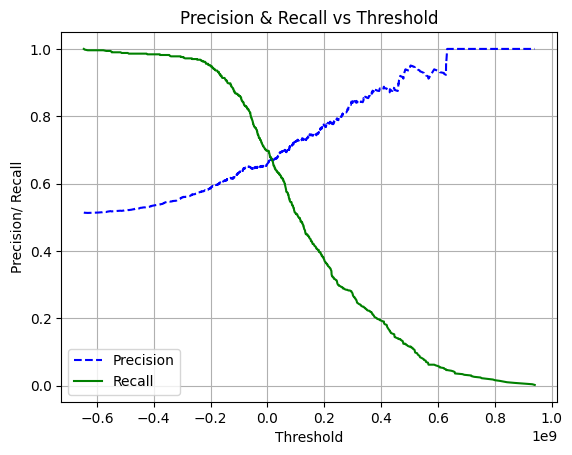

In [ ]:
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
  plt.plot(thresholds, precisions[:-1], "b--", label='Precision')
  plt.plot(thresholds, recalls[:-1], "g-", label='Recall')
  plt.title('Precision & Recall vs Threshold')
  plt.xlabel("Threshold")
  plt.ylabel("Precision/ Recall")
  plt.legend()
  plt.grid()

plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

Precision VS Recall

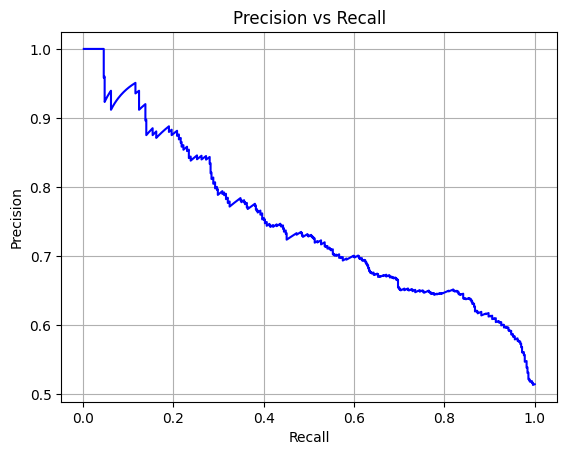

In [ ]:
def plot_precision_vs_recall(precisions, recalls):
  plt.plot(recalls[:-1], precisions[:-1], "b-")
  plt.title('Precision vs Recall')
  plt.xlabel("Recall")
  plt.ylabel("Precision")
  plt.grid()

plot_precision_vs_recall(precisions, recalls)
plt.show()

In [ ]:
threshold_precision = thresholds[np.argmax(precisions >= 0.75)]
threshold_precision

178967221.65109202

In [ ]:
# for all the predictions in which the scores >= threshold at 93% precision
y_train_pred = (y_scores >= threshold_precision)

In [ ]:
precision_score(y_train, y_train_pred)

0.75

In [ ]:
recall_score(y_train, y_train_pred)

0.4028056112224449

ROC Curve

In [ ]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_train, y_scores)

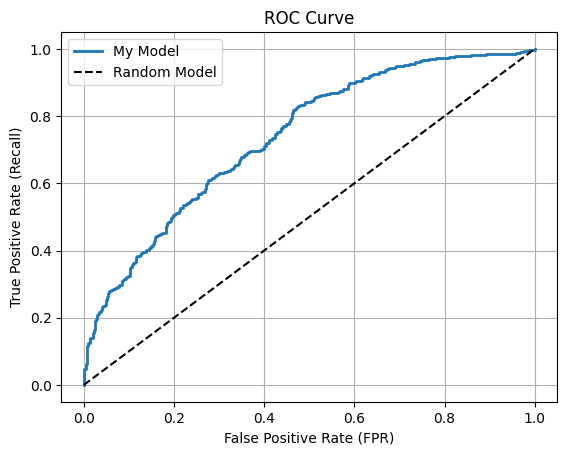

In [ ]:
def plot_roc_curve(fpr, tpr, label=None):
  plt.plot(fpr, tpr, linewidth=2, label=label)
  plt.plot([0,1], [0,1], 'k--', label='Random Model') # Dashed diagonal
  plt.legend()
  plt.title('ROC Curve')
  plt.xlabel("False Positive Rate (FPR)")
  plt.ylabel("True Positive Rate (Recall)")
  plt.grid()

plot_roc_curve(fpr, tpr, label='My Model')
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_train, y_scores)

0.739126558201148

Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

forest_clf_gray = RandomForestClassifier(random_state=42)
y_probas_forest = cross_val_predict(forest_clf_gray, x_train, y_train,
                                    cv=3, method='predict_proba')

In [ ]:
# index 0 - negative class,
# index 1 - positive class

y_probas_forest[:5]

array([[0.79, 0.21],
       [0.23, 0.77],
       [0.24, 0.76],
       [0.1 , 0.9 ],
       [0.54, 0.46]])

In [ ]:
y_scores_forest = y_probas_forest[:, 1]  # score = proba of positive class
fpr_forest, tpr_forest, thresholds_forest = roc_curve(y_train, y_scores_forest)

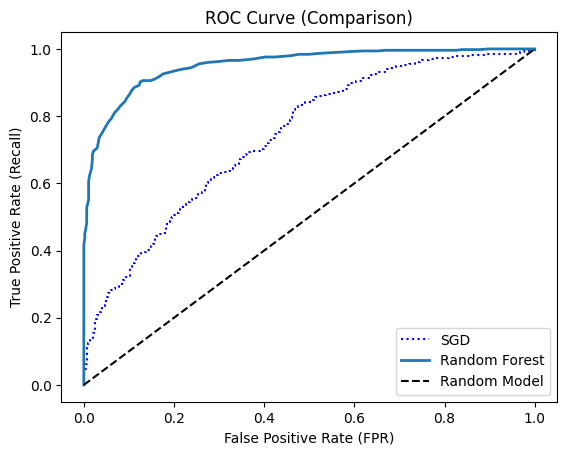

In [ ]:
plt.plot(fpr, tpr, 'b:', label='SGD')
plot_roc_curve(fpr_forest, tpr_forest, 'Random Forest')
plt.legend(loc='lower right')
plt.title('ROC Curve (Comparison)')
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (Recall)")
plt.grid()

plt.show()

In [ ]:
roc_auc_score(y_train, y_scores_forest)

0.9523390000339662

In [ ]:
cross_val_score(forest_clf_gray, x_train, y_train, cv=3, scoring='accuracy')

array([0.91666667, 0.87962963, 0.86996904])

In [ ]:
from sklearn.model_selection import cross_val_predict

y_train_pred = cross_val_predict(forest_clf_gray, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train, y_train_pred)

array([[413,  59],
       [ 49, 450]])

In [ ]:
y_train_perfect_predictions = y_train
confusion_matrix(y_train, y_train_perfect_predictions)

array([[472,   0],
       [  0, 499]])

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.8840864440078585
Recall score:  0.9018036072144289
F1 score:  0.8928571428571428


Predictions on grascale images

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name, cv2.IMREAD_GRAYSCALE)
      img = [cv2.resize(img, (256, 256))]

      view_img = cv2.imread(file_name, cv2.IMREAD_GRAYSCALE)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

-------STOCHASTIC GRADIENT MODEL-------:



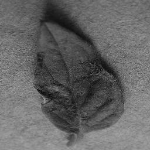

prediction:  [1]
prediction label:  plant
CORRECT



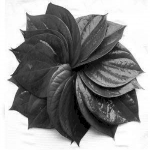

prediction:  [1]
prediction label:  plant
CORRECT



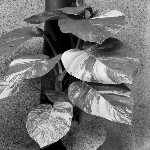

prediction:  [1]
prediction label:  plant
CORRECT



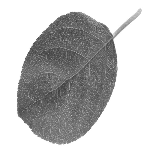

prediction:  [1]
prediction label:  plant
CORRECT



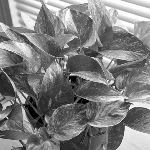

prediction:  [1]
prediction label:  plant
CORRECT



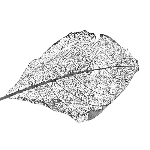

prediction:  [0]
prediction label:  non-plant
WRONG!



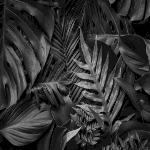

prediction:  [0]
prediction label:  non-plant
WRONG!



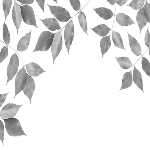

prediction:  [1]
prediction label:  plant
CORRECT



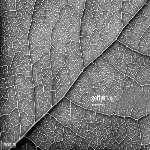

prediction:  [0]
prediction label:  non-plant
WRONG!



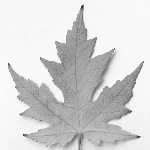

prediction:  [1]
prediction label:  plant
CORRECT



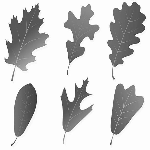

prediction:  [1]
prediction label:  plant
CORRECT



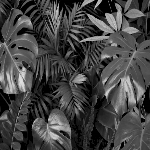

prediction:  [0]
prediction label:  non-plant
WRONG!



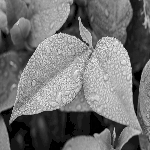

prediction:  [1]
prediction label:  plant
CORRECT



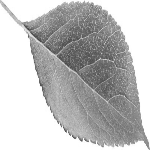

prediction:  [1]
prediction label:  plant
CORRECT



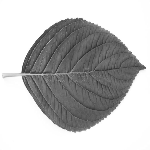

prediction:  [1]
prediction label:  plant
CORRECT



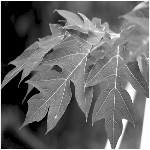

prediction:  [0]
prediction label:  non-plant
WRONG!



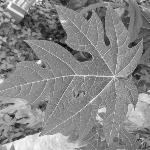

prediction:  [1]
prediction label:  plant
CORRECT



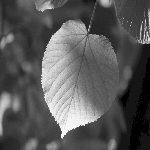

prediction:  [0]
prediction label:  non-plant
WRONG!



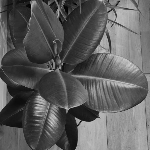

prediction:  [1]
prediction label:  plant
CORRECT



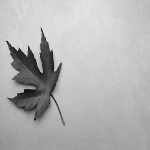

prediction:  [1]
prediction label:  plant
CORRECT



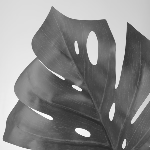

prediction:  [1]
prediction label:  plant
CORRECT



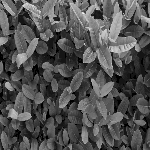

prediction:  [0]
prediction label:  non-plant
WRONG!



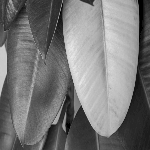

prediction:  [0]
prediction label:  non-plant
WRONG!



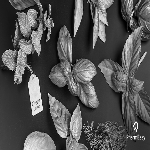

prediction:  [1]
prediction label:  plant
CORRECT



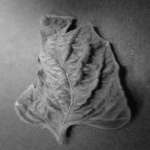

prediction:  [0]
prediction label:  non-plant
WRONG!



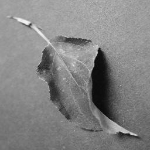

prediction:  [0]
prediction label:  non-plant
WRONG!



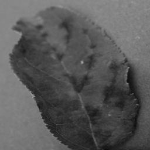

prediction:  [1]
prediction label:  plant
CORRECT



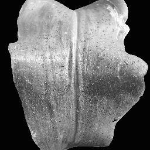

prediction:  [0]
prediction label:  non-plant
WRONG!



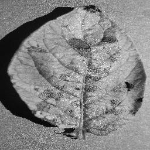

prediction:  [0]
prediction label:  non-plant
WRONG!



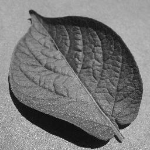

prediction:  [1]
prediction label:  plant
CORRECT



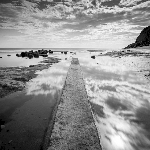

prediction:  [0]
prediction label:  non-plant
CORRECT



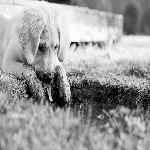

prediction:  [0]
prediction label:  non-plant
CORRECT



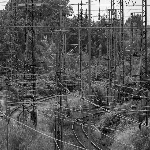

prediction:  [1]
prediction label:  plant
WRONG!



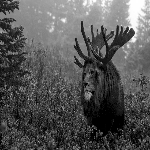

prediction:  [0]
prediction label:  non-plant
CORRECT



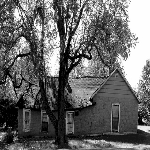

prediction:  [0]
prediction label:  non-plant
CORRECT



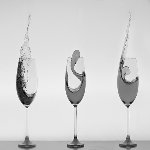

prediction:  [0]
prediction label:  non-plant
CORRECT



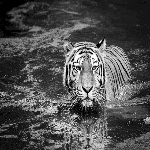

prediction:  [0]
prediction label:  non-plant
CORRECT



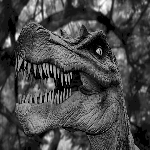

prediction:  [1]
prediction label:  plant
WRONG!



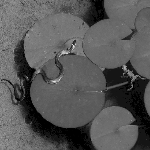

prediction:  [0]
prediction label:  non-plant
CORRECT



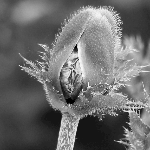

prediction:  [0]
prediction label:  non-plant
CORRECT



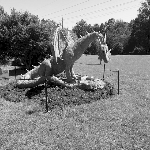

prediction:  [0]
prediction label:  non-plant
CORRECT



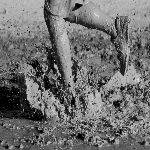

prediction:  [0]
prediction label:  non-plant
CORRECT



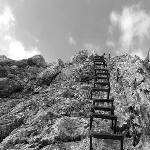

prediction:  [0]
prediction label:  non-plant
CORRECT



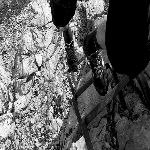

prediction:  [0]
prediction label:  non-plant
CORRECT



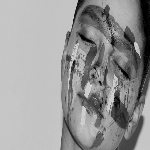

prediction:  [1]
prediction label:  plant
WRONG!



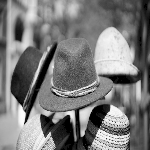

prediction:  [1]
prediction label:  plant
WRONG!



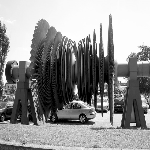

prediction:  [1]
prediction label:  plant
WRONG!



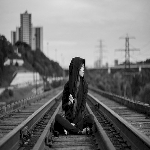

prediction:  [0]
prediction label:  non-plant
CORRECT



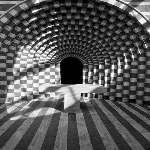

prediction:  [0]
prediction label:  non-plant
CORRECT



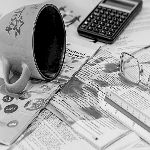

prediction:  [1]
prediction label:  plant
WRONG!



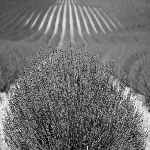

prediction:  [0]
prediction label:  non-plant
CORRECT



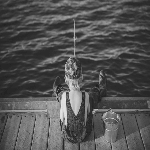

prediction:  [1]
prediction label:  plant
WRONG!



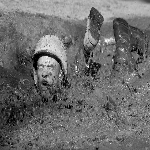

prediction:  [0]
prediction label:  non-plant
CORRECT



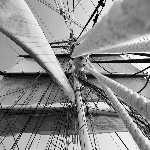

prediction:  [0]
prediction label:  non-plant
CORRECT



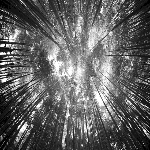

prediction:  [0]
prediction label:  non-plant
CORRECT



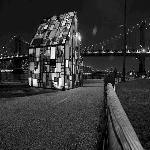

prediction:  [0]
prediction label:  non-plant
CORRECT



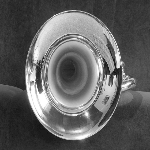

prediction:  [0]
prediction label:  non-plant
CORRECT



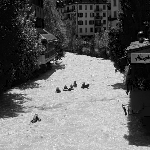

prediction:  [1]
prediction label:  plant
WRONG!



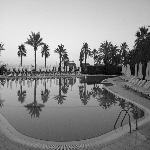

prediction:  [0]
prediction label:  non-plant
CORRECT



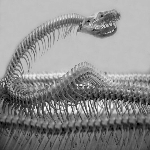

prediction:  [0]
prediction label:  non-plant
CORRECT



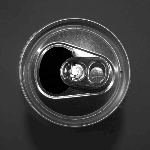

prediction:  [0]
prediction label:  non-plant
CORRECT



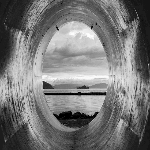

prediction:  [0]
prediction label:  non-plant
CORRECT



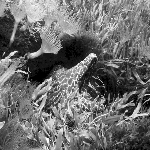

prediction:  [0]
prediction label:  non-plant
CORRECT



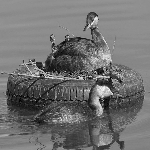

prediction:  [1]
prediction label:  plant
WRONG!



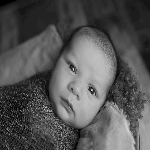

prediction:  [1]
prediction label:  plant
WRONG!



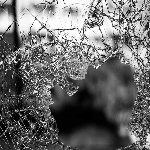

prediction:  [0]
prediction label:  non-plant
CORRECT



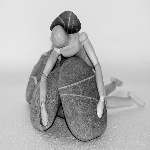

prediction:  [1]
prediction label:  plant
WRONG!



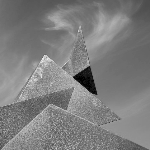

prediction:  [0]
prediction label:  non-plant
CORRECT



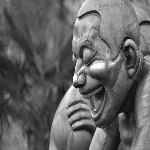

prediction:  [1]
prediction label:  plant
WRONG!



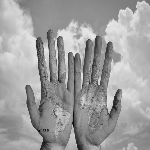

prediction:  [0]
prediction label:  non-plant
CORRECT



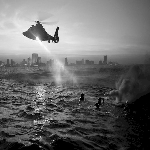

prediction:  [0]
prediction label:  non-plant
CORRECT



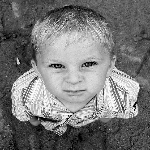

prediction:  [0]
prediction label:  non-plant
CORRECT



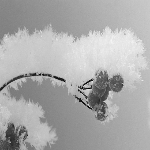

prediction:  [0]
prediction label:  non-plant
CORRECT



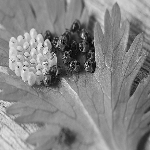

prediction:  [1]
prediction label:  plant
WRONG!



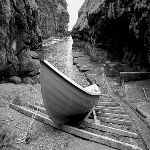

prediction:  [1]
prediction label:  plant
WRONG!



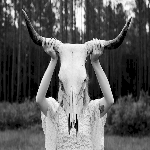

prediction:  [1]
prediction label:  plant
WRONG!



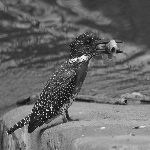

prediction:  [1]
prediction label:  plant
WRONG!



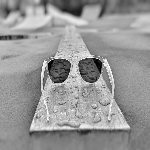

prediction:  [0]
prediction label:  non-plant
CORRECT



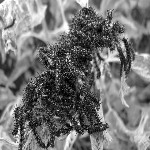

prediction:  [1]
prediction label:  plant
WRONG!



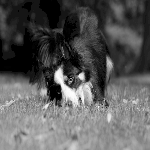

prediction:  [1]
prediction label:  plant
WRONG!



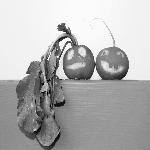

prediction:  [0]
prediction label:  non-plant
CORRECT



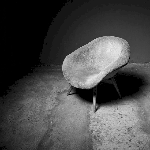

prediction:  [1]
prediction label:  plant
WRONG!



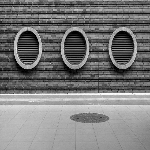

prediction:  [1]
prediction label:  plant
WRONG!



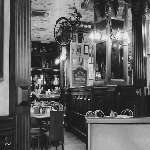

prediction:  [1]
prediction label:  plant
WRONG!



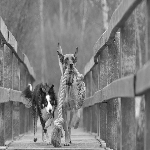

prediction:  [0]
prediction label:  non-plant
CORRECT



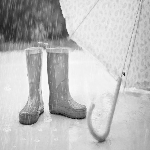

prediction:  [1]
prediction label:  plant
WRONG!



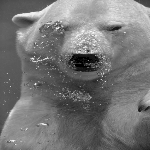

prediction:  [0]
prediction label:  non-plant
CORRECT



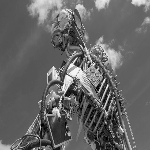

prediction:  [1]
prediction label:  plant
WRONG!



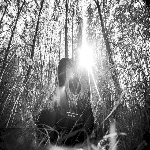

prediction:  [0]
prediction label:  non-plant
CORRECT



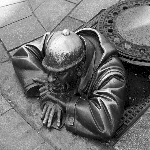

prediction:  [0]
prediction label:  non-plant
CORRECT



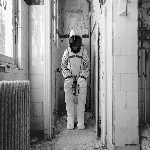

prediction:  [0]
prediction label:  non-plant
CORRECT



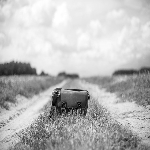

prediction:  [0]
prediction label:  non-plant
CORRECT



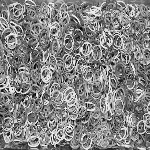

prediction:  [1]
prediction label:  plant
WRONG!



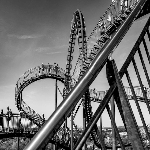

prediction:  [0]
prediction label:  non-plant
CORRECT



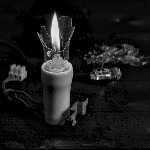

prediction:  [0]
prediction label:  non-plant
CORRECT



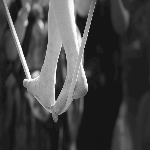

prediction:  [0]
prediction label:  non-plant
CORRECT



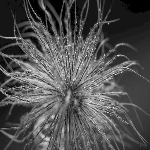

prediction:  [0]
prediction label:  non-plant
CORRECT



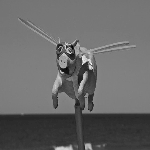

prediction:  [0]
prediction label:  non-plant
CORRECT



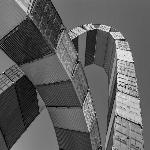

prediction:  [0]
prediction label:  non-plant
CORRECT



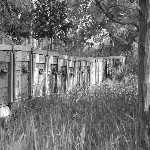

prediction:  [1]
prediction label:  plant
WRONG!



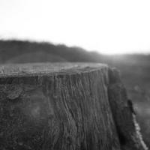

prediction:  [0]
prediction label:  non-plant
CORRECT



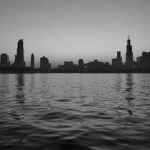

prediction:  [0]
prediction label:  non-plant
CORRECT



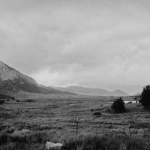

prediction:  [0]
prediction label:  non-plant
CORRECT



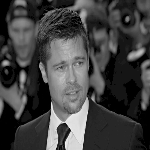

prediction:  [1]
prediction label:  plant
WRONG!



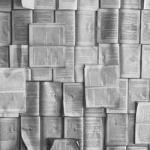

prediction:  [1]
prediction label:  plant
WRONG!



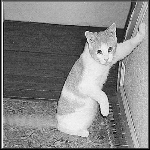

prediction:  [1]
prediction label:  plant
WRONG!



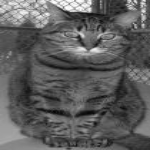

prediction:  [1]
prediction label:  plant
WRONG!



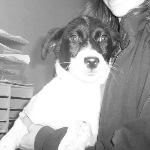

prediction:  [1]
prediction label:  plant
WRONG!



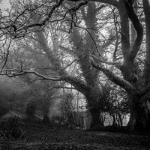

prediction:  [0]
prediction label:  non-plant
CORRECT



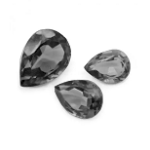

prediction:  [0]
prediction label:  non-plant
CORRECT



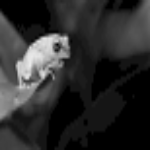

prediction:  [0]
prediction label:  non-plant
CORRECT



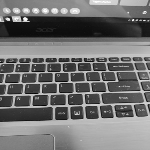

prediction:  [1]
prediction label:  plant
WRONG!



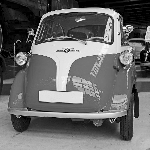

prediction:  [1]
prediction label:  plant
WRONG!



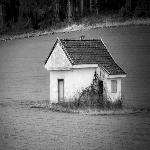

prediction:  [0]
prediction label:  non-plant
CORRECT



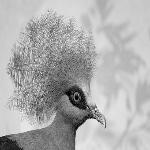

prediction:  [0]
prediction label:  non-plant
CORRECT



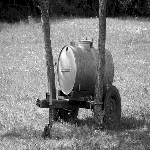

prediction:  [0]
prediction label:  non-plant
CORRECT



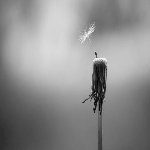

prediction:  [0]
prediction label:  non-plant
CORRECT



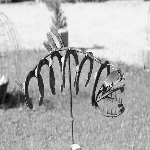

prediction:  [0]
prediction label:  non-plant
CORRECT



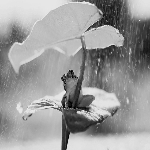

prediction:  [0]
prediction label:  non-plant
CORRECT


Correct predictions: 75 / 119
Incorrect predictions: 44 / 119
Accuracy % = 63.03


In [ ]:
print("-------STOCHASTIC GRADIENT MODEL-------:\n")
predict_func(sgd_clf_gray)

-------RANDOM FOREST MODEL-------:



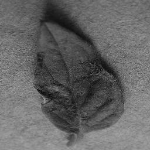

prediction:  [1]
prediction label:  plant
CORRECT



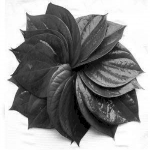

prediction:  [0]
prediction label:  non-plant
WRONG!



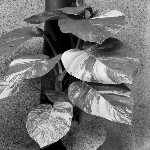

prediction:  [0]
prediction label:  non-plant
WRONG!



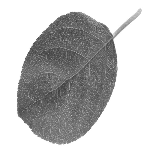

prediction:  [0]
prediction label:  non-plant
WRONG!



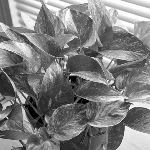

prediction:  [0]
prediction label:  non-plant
WRONG!



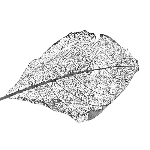

prediction:  [1]
prediction label:  plant
CORRECT



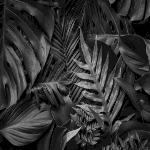

prediction:  [0]
prediction label:  non-plant
WRONG!



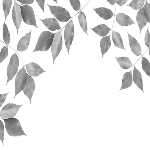

prediction:  [1]
prediction label:  plant
CORRECT



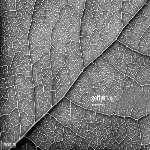

prediction:  [0]
prediction label:  non-plant
WRONG!



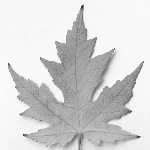

prediction:  [0]
prediction label:  non-plant
WRONG!



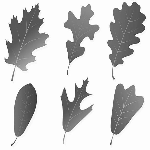

prediction:  [1]
prediction label:  plant
CORRECT



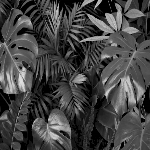

prediction:  [0]
prediction label:  non-plant
WRONG!



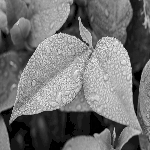

prediction:  [0]
prediction label:  non-plant
WRONG!



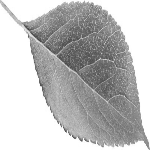

prediction:  [0]
prediction label:  non-plant
WRONG!



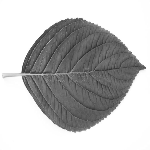

prediction:  [0]
prediction label:  non-plant
WRONG!



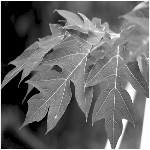

prediction:  [0]
prediction label:  non-plant
WRONG!



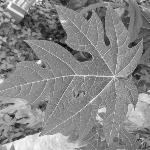

prediction:  [1]
prediction label:  plant
CORRECT



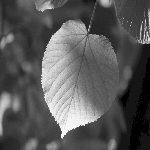

prediction:  [0]
prediction label:  non-plant
WRONG!



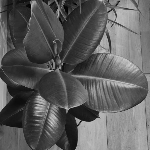

prediction:  [1]
prediction label:  plant
CORRECT



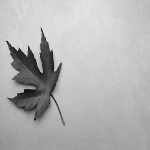

prediction:  [0]
prediction label:  non-plant
WRONG!



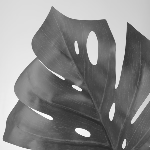

prediction:  [0]
prediction label:  non-plant
WRONG!



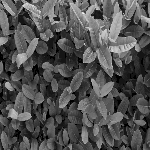

prediction:  [0]
prediction label:  non-plant
WRONG!



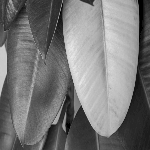

prediction:  [0]
prediction label:  non-plant
WRONG!



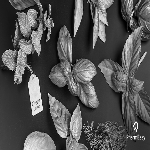

prediction:  [0]
prediction label:  non-plant
WRONG!



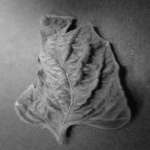

prediction:  [0]
prediction label:  non-plant
WRONG!



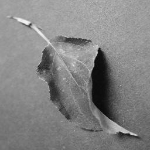

prediction:  [1]
prediction label:  plant
CORRECT



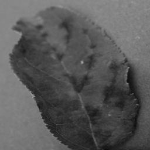

prediction:  [1]
prediction label:  plant
CORRECT



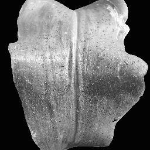

prediction:  [1]
prediction label:  plant
CORRECT



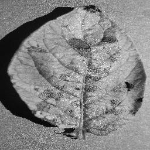

prediction:  [0]
prediction label:  non-plant
WRONG!



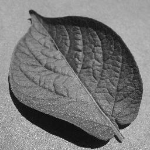

prediction:  [1]
prediction label:  plant
CORRECT



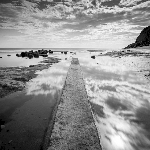

prediction:  [0]
prediction label:  non-plant
CORRECT



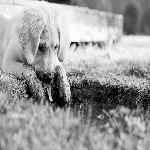

prediction:  [0]
prediction label:  non-plant
CORRECT



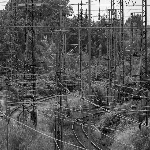

prediction:  [0]
prediction label:  non-plant
CORRECT



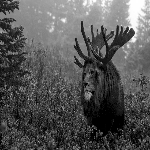

prediction:  [0]
prediction label:  non-plant
CORRECT



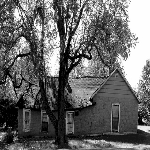

prediction:  [0]
prediction label:  non-plant
CORRECT



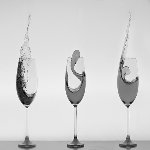

prediction:  [0]
prediction label:  non-plant
CORRECT



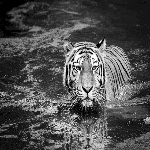

prediction:  [0]
prediction label:  non-plant
CORRECT



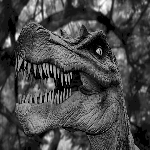

prediction:  [0]
prediction label:  non-plant
CORRECT



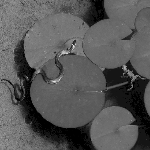

prediction:  [1]
prediction label:  plant
WRONG!



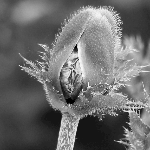

prediction:  [0]
prediction label:  non-plant
CORRECT



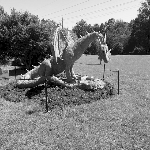

prediction:  [0]
prediction label:  non-plant
CORRECT



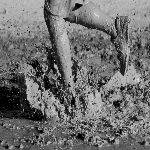

prediction:  [0]
prediction label:  non-plant
CORRECT



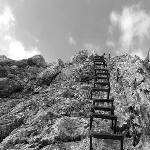

prediction:  [0]
prediction label:  non-plant
CORRECT



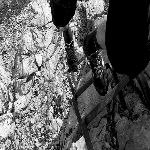

prediction:  [0]
prediction label:  non-plant
CORRECT



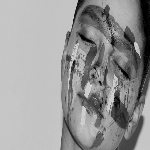

prediction:  [0]
prediction label:  non-plant
CORRECT



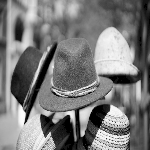

prediction:  [0]
prediction label:  non-plant
CORRECT



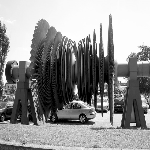

prediction:  [0]
prediction label:  non-plant
CORRECT



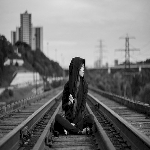

prediction:  [0]
prediction label:  non-plant
CORRECT



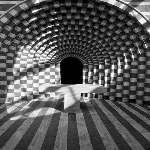

prediction:  [0]
prediction label:  non-plant
CORRECT



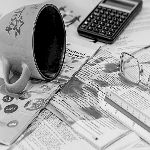

prediction:  [0]
prediction label:  non-plant
CORRECT



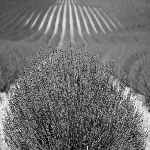

prediction:  [0]
prediction label:  non-plant
CORRECT



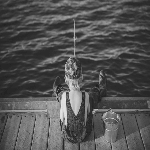

prediction:  [0]
prediction label:  non-plant
CORRECT



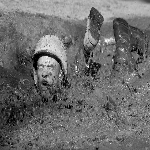

prediction:  [0]
prediction label:  non-plant
CORRECT



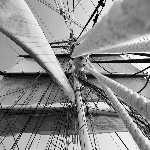

prediction:  [0]
prediction label:  non-plant
CORRECT



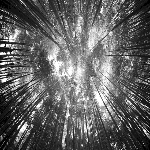

prediction:  [0]
prediction label:  non-plant
CORRECT



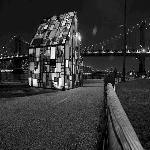

prediction:  [0]
prediction label:  non-plant
CORRECT



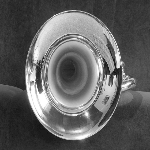

prediction:  [0]
prediction label:  non-plant
CORRECT



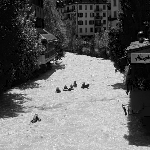

prediction:  [0]
prediction label:  non-plant
CORRECT



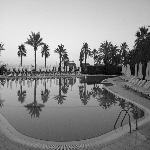

prediction:  [0]
prediction label:  non-plant
CORRECT



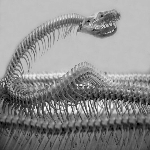

prediction:  [0]
prediction label:  non-plant
CORRECT



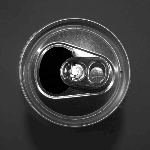

prediction:  [0]
prediction label:  non-plant
CORRECT



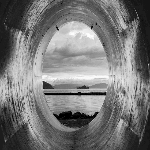

prediction:  [0]
prediction label:  non-plant
CORRECT



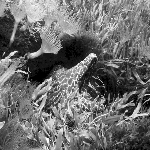

prediction:  [0]
prediction label:  non-plant
CORRECT



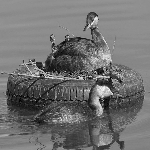

prediction:  [1]
prediction label:  plant
WRONG!



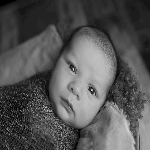

prediction:  [0]
prediction label:  non-plant
CORRECT



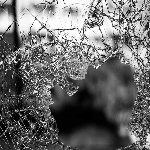

prediction:  [0]
prediction label:  non-plant
CORRECT



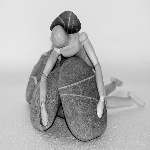

prediction:  [0]
prediction label:  non-plant
CORRECT



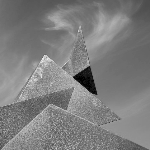

prediction:  [1]
prediction label:  plant
WRONG!



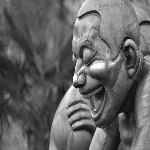

prediction:  [0]
prediction label:  non-plant
CORRECT



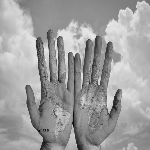

prediction:  [0]
prediction label:  non-plant
CORRECT



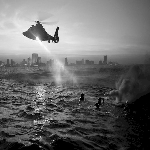

prediction:  [0]
prediction label:  non-plant
CORRECT



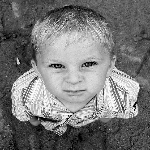

prediction:  [0]
prediction label:  non-plant
CORRECT



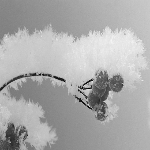

prediction:  [0]
prediction label:  non-plant
CORRECT



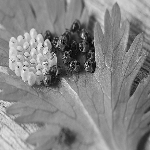

prediction:  [1]
prediction label:  plant
WRONG!



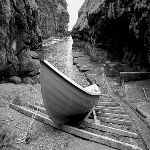

prediction:  [0]
prediction label:  non-plant
CORRECT



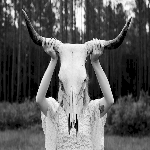

prediction:  [0]
prediction label:  non-plant
CORRECT



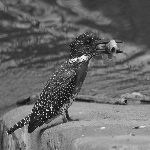

prediction:  [0]
prediction label:  non-plant
CORRECT



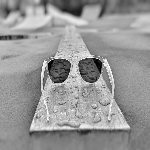

prediction:  [0]
prediction label:  non-plant
CORRECT



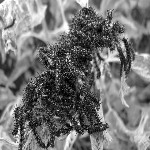

prediction:  [0]
prediction label:  non-plant
CORRECT



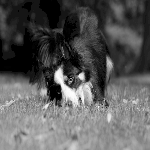

prediction:  [0]
prediction label:  non-plant
CORRECT



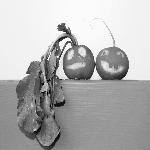

prediction:  [0]
prediction label:  non-plant
CORRECT



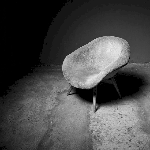

prediction:  [0]
prediction label:  non-plant
CORRECT



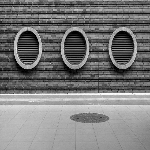

prediction:  [0]
prediction label:  non-plant
CORRECT



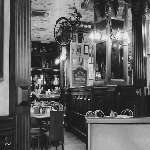

prediction:  [0]
prediction label:  non-plant
CORRECT



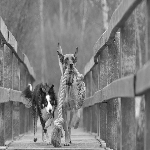

prediction:  [0]
prediction label:  non-plant
CORRECT



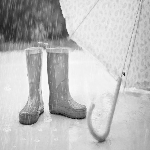

prediction:  [0]
prediction label:  non-plant
CORRECT



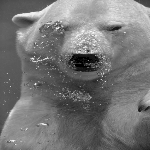

prediction:  [0]
prediction label:  non-plant
CORRECT



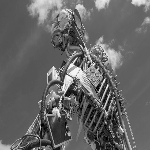

prediction:  [0]
prediction label:  non-plant
CORRECT



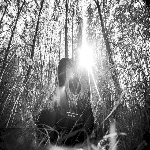

prediction:  [0]
prediction label:  non-plant
CORRECT



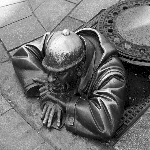

prediction:  [0]
prediction label:  non-plant
CORRECT



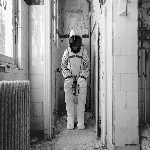

prediction:  [0]
prediction label:  non-plant
CORRECT



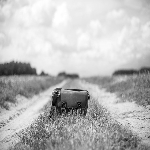

prediction:  [0]
prediction label:  non-plant
CORRECT



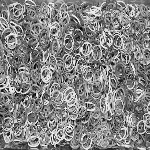

prediction:  [0]
prediction label:  non-plant
CORRECT



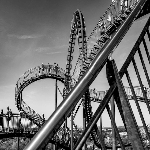

prediction:  [0]
prediction label:  non-plant
CORRECT



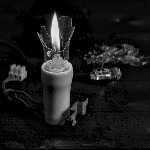

prediction:  [0]
prediction label:  non-plant
CORRECT



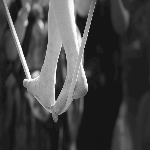

prediction:  [0]
prediction label:  non-plant
CORRECT



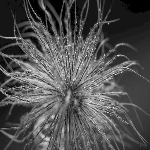

prediction:  [0]
prediction label:  non-plant
CORRECT



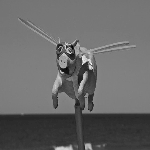

prediction:  [0]
prediction label:  non-plant
CORRECT



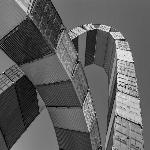

prediction:  [0]
prediction label:  non-plant
CORRECT



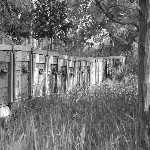

prediction:  [0]
prediction label:  non-plant
CORRECT



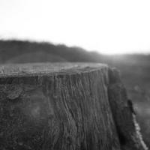

prediction:  [0]
prediction label:  non-plant
CORRECT



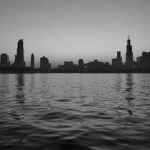

prediction:  [0]
prediction label:  non-plant
CORRECT



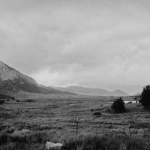

prediction:  [0]
prediction label:  non-plant
CORRECT



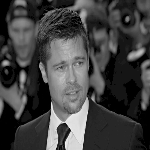

prediction:  [0]
prediction label:  non-plant
CORRECT



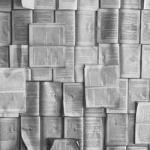

prediction:  [0]
prediction label:  non-plant
CORRECT



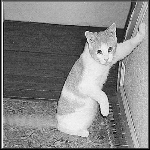

prediction:  [0]
prediction label:  non-plant
CORRECT



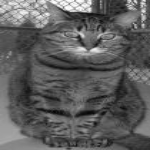

prediction:  [1]
prediction label:  plant
WRONG!



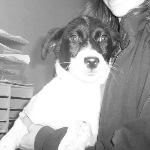

prediction:  [0]
prediction label:  non-plant
CORRECT



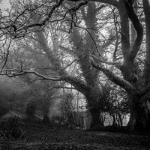

prediction:  [0]
prediction label:  non-plant
CORRECT



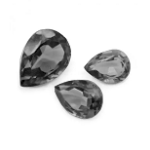

prediction:  [1]
prediction label:  plant
WRONG!



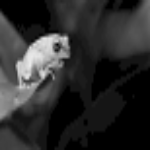

prediction:  [0]
prediction label:  non-plant
CORRECT



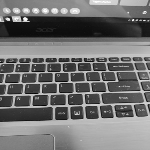

prediction:  [1]
prediction label:  plant
WRONG!



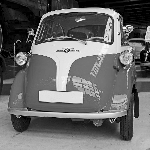

prediction:  [0]
prediction label:  non-plant
CORRECT



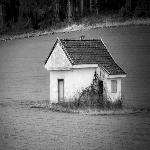

prediction:  [0]
prediction label:  non-plant
CORRECT



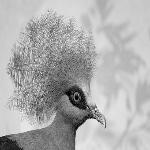

prediction:  [0]
prediction label:  non-plant
CORRECT



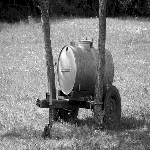

prediction:  [0]
prediction label:  non-plant
CORRECT



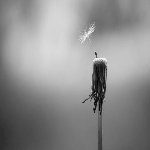

prediction:  [0]
prediction label:  non-plant
CORRECT



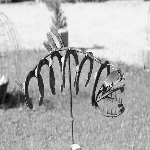

prediction:  [0]
prediction label:  non-plant
CORRECT



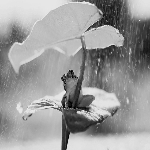

prediction:  [0]
prediction label:  non-plant
CORRECT


Correct predictions: 92 / 119
Incorrect predictions: 27 / 119
Accuracy % = 77.31


In [ ]:
forest_clf_gray.fit(x_train, y_train)

print("-------RANDOM FOREST MODEL-------:\n")
predict_func(forest_clf_gray)

#### Image Loading + preprocessing

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
# Load plant images
path = "/content/drive/MyDrive/Dataset/dataset750/"
plant_images = []
flag = True

for i in range(1, 751):
  img = cv2.imread(path + "plant/plant ({0}).JPG".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  img = img.astype('float32')
  img /= 255.0      # Normalizing values to lie in the range: [0, 1]
  plant_images.append(img)

# Load non-plant images
non_plant_images = []
for i in range(1, 701):
  img = cv2.imread(path + "non_plant/not_leaf ({0}).jpg".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  img = img.astype('float32')
  img /= 255.0
  non_plant_images.append(img)

In [ ]:
X = plant_images + non_plant_images
X = np.array(X)

In [ ]:
y_plant = [1] * len(plant_images)
y_non_plant = [0] * len(non_plant_images)
y = y_plant + y_non_plant
y = np.array(y)
y = y.astype(np.uint8)

In [ ]:
len(y), len(X)

(1450, 1450)

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
len(plant_images), len(plant_images[0]), len(plant_images[0][0]), len(plant_images[0][0][0])

(750, 256, 256, 3)

In [ ]:
x_train = np.reshape(x_train, (len(x_train), -1))
x_train.shape

(971, 196608)

In [ ]:
x_test = np.reshape(x_test, (len(x_test), -1))
x_test.shape

(479, 196608)

#### SVC

In [ ]:
X[506]

##### Model: Linear SVC (Linear model)

In [ ]:
# Load the LinearSVC model
import pickle

path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'linear_SVC.sav'

linear_svm_clf = pickle.load(open(path_model + filename, 'rb'))

Sequentially apply a list of transforms and a final estimator. Intermediate steps of the pipeline must be ‘transforms’, that is, they must implement fit and transform methods. The final estimator only needs to implement fit.

In [ ]:
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Creating a pipeline for the steps
linear_svm_clf = Pipeline([
            ("scaler", StandardScaler()),
            ("linear_svc", LinearSVC(C=1, loss="hinge", max_iter=1500)),
          ])

# Train the classifier
linear_svm_clf.fit(x_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('linear_svc', LinearSVC(C=1, loss='hinge', max_iter=1500))])

In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_score(linear_svm_clf, x_train, y_train, cv=3, scoring='accuracy')

array([0.93209877, 0.93209877, 0.91331269])

In [ ]:
from sklearn.model_selection import cross_val_predict

# sklearn predefined cross-validation
y_train_pred = cross_val_predict(linear_svm_clf, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_train, y_train_pred)

In [ ]:
cm

array([[466,   6],
       [ 59, 440]])

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.9865470852017937
Recall score:  0.8817635270541082
F1 score:  0.9312169312169312


In [ ]:
y_test_pred = cross_val_predict(linear_svm_clf, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.9302325581395349
Recall score:  0.9561752988047809
F1 score:  0.9430255402750491


In [ ]:
# Save the LinearSVC model
import pickle

path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'linear_SVC.sav'

pickle.dump(linear_svm_clf, open(path_model + filename, 'wb'))

Predictions on unseen data

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      # img = cv2.resize(img, (256, 256))
      # img /= 255.0
      # img = [img]
      img = [cv2.resize(img, (256, 256))]

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
print("-------LINEAR SVM MODEL-------:\n")
predict_func(linear_svm_clf)

Save the trained model

In [ ]:
# Save the Linear SVC model
import pickle

path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'svm_linear_clf.sav'

pickle.dump(linear_svm_clf, open(path_model + filename, 'wb'))

##### Model: Polynomial Kernel (Non-linear model)

Finding the best parameters using GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# defining parameter range
param_grid = {'C': [0.001, 0.1, 1, 5, 10, 100],
              # 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'coef0': [1],
              'degree': [3, 4, 5, 6, 7, 8, 9, 10],
              'kernel': ['poly']
              }

# kernel="poly", degree=3, coef0=1, C=5
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3, cv = 3)

# fitting the model for grid search
grid.fit(x_train, y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits
[CV 1/3] END C=0.001, coef0=1, degree=3, kernel=poly;, score=0.812 total time= 2.5min
[CV 2/3] END C=0.001, coef0=1, degree=3, kernel=poly;, score=0.818 total time= 2.4min
[CV 3/3] END C=0.001, coef0=1, degree=3, kernel=poly;, score=0.817 total time= 1.8min
[CV 1/3] END C=0.001, coef0=1, degree=4, kernel=poly;, score=0.877 total time= 1.4min
[CV 2/3] END C=0.001, coef0=1, degree=4, kernel=poly;, score=0.889 total time= 1.7min
[CV 3/3] END C=0.001, coef0=1, degree=4, kernel=poly;, score=0.851 total time= 1.4min
[CV 1/3] END C=0.001, coef0=1, degree=5, kernel=poly;, score=0.892 total time= 1.2min
[CV 2/3] END C=0.001, coef0=1, degree=5, kernel=poly;, score=0.886 total time= 1.2min
[CV 3/3] END C=0.001, coef0=1, degree=5, kernel=poly;, score=0.870 total time= 1.1min
[CV 1/3] END C=0.001, coef0=1, degree=6, kernel=poly;, score=0.883 total time=  58.0s
[CV 2/3] END C=0.001, coef0=1, degree=6, kernel=poly;, score=0.907 total time=

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [0.001, 0.1, 1, 5, 10, 100], 'coef0': [1],
                         'degree': [3, 4, 5, 6, 7, 8, 9, 10],
                         'kernel': ['poly']},
             verbose=3)

In [ ]:
from sklearn.model_selection import ParameterGrid

ParameterGrid(param_grid)

In [ ]:
# print best parameter after tuning
grid.best_params_

{'C': 0.1, 'coef0': 1, 'degree': 4, 'kernel': 'poly'}

In [ ]:
grid.best_estimator_

SVC(C=0.1, coef0=1, degree=4, kernel='poly')

Model

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Parameters from GridSearchCV
svm_poly_clf = Pipeline([
            ("scaler", StandardScaler()),
            ("svm_clf", SVC(kernel="poly", degree=3, coef0=1, C=5))
            # ("svm_clf", SVC(kernel="poly", degree=4, coef0=1, C=0.1))
          ])

svm_poly_clf.fit(x_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf', SVC(C=5, coef0=1, kernel='poly'))])

In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_score(svm_poly_clf, x_train, y_train, cv=3, scoring='accuracy')

array([0.93209877, 0.90740741, 0.92569659])

In [ ]:
from sklearn.model_selection import cross_val_predict

# sklearn predefined cross-validation
y_train_pred = cross_val_predict(svm_poly_clf, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_train, y_train_pred)

In [ ]:
cm

array([[419,  53],
       [ 23, 476]])

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_predictions = svm_poly_clf.predict(x_test)

print('Classification Report: ')
print(classification_report(y_test, y_predictions))

Classification Report: 
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       228
           1       0.94      0.97      0.95       251

    accuracy                           0.95       479
   macro avg       0.95      0.95      0.95       479
weighted avg       0.95      0.95      0.95       479



In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.8998109640831758
Recall score:  0.9539078156312625
F1 score:  0.9260700389105058


In [ ]:
y_test_pred = cross_val_predict(svm_poly_clf, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.9040590405904059
Recall score:  0.9760956175298805
F1 score:  0.9386973180076629


Predictions on unseen data

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      # img = cv2.resize(img, (256, 256))
      # img /= 255.0
      # img = [img]
      img = [cv2.resize(img, (256, 256))]

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
print("-------POLYNOMIAL SVM MODEL-------:\n")
predict_func(svm_poly_clf)

Save the trained model

In [ ]:
# Save the Polynomial SVC model
import pickle

path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'svm_poly_clf.sav'

pickle.dump(svm_poly_clf, open(path_model + filename, 'wb'))

##### Model: Gaussian RBF Kernel (Non-linear model)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': [1, 0.1, 0.01, 0.001],
              'kernel': ['rbf']
              }

grid2 = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3, cv = 3)

# fitting the model for grid search
grid2.fit(x_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV 1/3] END ........C=0.1, gamma=1, kernel=rbf;, score=0.512 total time= 3.7min
[CV 2/3] END ........C=0.1, gamma=1, kernel=rbf;, score=0.515 total time= 3.3min
[CV 3/3] END ........C=0.1, gamma=1, kernel=rbf;, score=0.514 total time= 3.3min
[CV 1/3] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.512 total time= 3.2min
[CV 2/3] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.515 total time= 2.9min
[CV 3/3] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.514 total time= 2.9min
[CV 1/3] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.512 total time= 3.0min
[CV 2/3] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.515 total time= 2.9min
[CV 3/3] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.514 total time= 2.9min
[CV 1/3] END ....C=0.1, gamma=0.001, kernel=rbf;, score=0.512 total time= 2.8min
[CV 2/3] END ....C=0.1, gamma=0.001, kernel=rbf;, score=0.515 total time= 2.9min
[CV 3/3] END ....C=0.1, gamma=0.001, kernel=rbf;

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf']},
             verbose=3)

In [ ]:
# print best parameter after tuning
grid2.best_params_

{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}

In [ ]:
grid2.best_estimator_

SVC(C=10, gamma=0.001)

Model

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# svm_rbf_clf = Pipeline([
#           ("scaler", StandardScaler()),
#           ("svm_clf", SVC(kernel="rbf", C=0.001, gamma=5))  # very bad - 25%
#        ])

svm_rbf_clf = SVC(kernel="rbf", C=10, gamma=0.001)
svm_rbf_clf.fit(x_train, y_train)

SVC(C=10, gamma=0.001)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_predictions = svm_rbf_clf.predict(x_test)

# print classification report
print(classification_report(y_test, y_predictions))

              precision    recall  f1-score   support

           0       0.62      0.97      0.76       228
           1       0.95      0.45      0.61       251

    accuracy                           0.70       479
   macro avg       0.78      0.71      0.69       479
weighted avg       0.79      0.70      0.68       479



In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_score(svm_rbf_clf, x_train, y_train, cv=3, scoring='accuracy')

array([0.7191358 , 0.67901235, 0.68111455])

In [ ]:
from sklearn.model_selection import cross_val_predict

y_train_pred = cross_val_predict(svm_rbf_clf, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_train, y_train_pred)

In [ ]:
cm

array([[459,  13],
       [285, 214]])

Precision, Recall and F1 score

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.9427312775330396
Recall score:  0.4288577154308617
F1 score:  0.5895316804407714


In [ ]:
y_test_pred = cross_val_predict(svm_rbf_clf, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.5262054507337526
Recall score:  1.0
F1 score:  0.6895604395604396


Predictions on unseen data

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = cv2.resize(img, (256, 256))
      img /= 255.0
      img = [img]
      # img = [cv2.resize(img, (256, 256))]

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
print("-------GAUSSIAN SVM MODEL-------:\n")
predict_func(svm_rbf_clf)

In [ ]:
# Save the GaussianSVC model
import pickle

path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'rbf_SVC.sav'

pickle.dump(svm_rbf_clf, open(path_model + filename, 'wb'))

#### Ensemble: Random Forest + Linear SVC

Load saved models: Random forest + Linear SVC

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import pickle
from sklearn.svm import LinearSVC
from sklearn.ensemble import VotingClassifier
from matplotlib import pyplot

from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot
from sklearn.svm import SVC
from numpy import mean
from numpy import std

In [ ]:
path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'

file_forest = 'forest_model.sav'
file_linear_svc = 'linear_SVC.sav'

forest_clf = pickle.load(open(path_model + file_forest, 'rb'))
linear_svm_clf = pickle.load(open(path_model + file_linear_svc, 'rb'))

In [ ]:
voting_clf = VotingClassifier(
                estimators=[('rfc', forest_clf), ('lsvc', linear_svm_clf)],
                voting='hard')

In [ ]:
# get a list of models to evaluate
def get_models():
  models = dict()
  models['rfc'] = RandomForestClassifier(random_state=42)
  models['lsvc'] = LinearSVC(C=1, loss="hinge", max_iter=1500)
  models['hard_voting'] = voting_clf
  return models

In [ ]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
 cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
 scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
 return scores

In [ ]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
  scores = evaluate_model(model, x_train, y_train)
  results.append(scores)
  names.append(name)
  print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

>rfc 0.931 (0.027)
>lsvc 0.938 (0.016)
>hard_voting 0.935 (0.024)


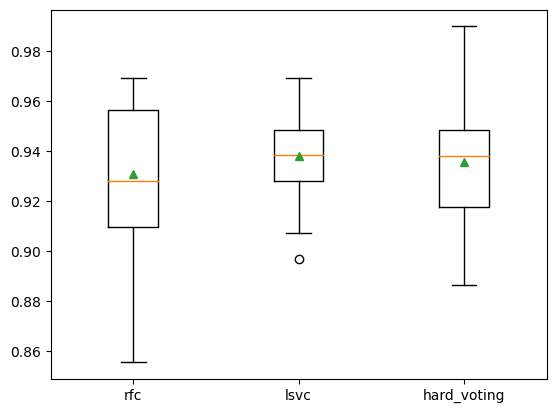

In [ ]:
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

In [ ]:
# Fitting the ensemble model onto the dataset
voting_clf.fit(x_train, y_train)

VotingClassifier(estimators=[('rfc', RandomForestClassifier(random_state=42)),
                             ('lsvc',
                              Pipeline(steps=[('scaler', StandardScaler()),
                                              ('linear_svc',
                                               LinearSVC(C=1, loss='hinge',
                                                         max_iter=1500))]))])

In [ ]:
cross_val_score(voting_clf, x_train, y_train, cv=3, scoring='accuracy')

array([0.94444444, 0.92901235, 0.92569659])

In [ ]:
# sklearn predefined cross-validation
y_train_pred = cross_val_predict(voting_clf, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_train, y_train_pred)
cm

array([[466,   6],
       [ 59, 440]])

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.9865470852017937
Recall score:  0.8817635270541082
F1 score:  0.9312169312169312


In [ ]:
y_test_pred = cross_val_predict(voting_clf, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.9826086956521739
Recall score:  0.900398406374502
F1 score:  0.9397089397089397


Predicting on unseen images

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = [cv2.resize(img, (256, 256))]
      # img = cv2.resize(img, (256, 256))  # Normalization portion
      # img /= 255.0
      # img = [img]

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
print("-------ENSEMBLE MODEL (Random forest + Linear SVC)-------:\n")
predict_func(voting_clf)

Saving the ensemble

In [ ]:
# Save the Ensemble model
path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'ensemble_rfc_lsvc.sav'

pickle.dump(voting_clf, open(path_model + filename, 'wb'))

#### Ensemble: Random Forest + Polynomial SVC

Load saved models: Random forest + Polynomial SVC

In [ ]:
import pickle
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot
from sklearn.svm import SVC
from numpy import mean
from numpy import std

In [ ]:
path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'

file_forest = 'forest_model.sav'
file_poly_svc = 'svm_poly_clf.sav'

forest_clf = pickle.load(open(path_model + file_forest, 'rb'))
svm_poly_clf = pickle.load(open(path_model + file_poly_svc, 'rb'))

Voting Ensemble:
https://machinelearningmastery.com/voting-ensembles-with-python/

In [ ]:
from sklearn.ensemble import VotingClassifier

voting_clf2 = VotingClassifier(
                estimators=[('rfc', forest_clf), ('psvc', svm_poly_clf)],
                # estimators=[('psvc', svm_poly_clf), ('rfc', forest_clf)],
                voting='hard')

In [ ]:
# get a list of models to evaluate
def get_models():
  models = dict()
  models['rfc'] = RandomForestClassifier(random_state=42)
  models['psvc'] = SVC(C=5, coef0=1, kernel='poly')
  models['hard_voting'] = voting_clf2
  return models

In [ ]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
 cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
 scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
 return scores

In [ ]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
  scores = evaluate_model(model, x_train, y_train)
  results.append(scores)
  names.append(name)
  print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

>rfc 0.931 (0.027)
>psvc 0.940 (0.020)
>hard_voting 0.933 (0.027)


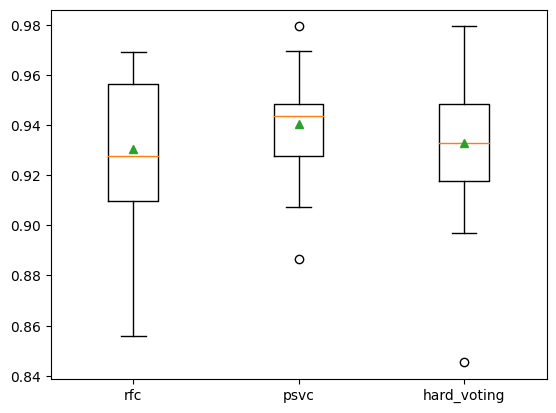

In [ ]:
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

In [ ]:
# Fitting the ensemble model onto the dataset
voting_clf2.fit(x_train, y_train)

VotingClassifier(estimators=[('rfc', RandomForestClassifier(random_state=42)),
                             ('psvc',
                              Pipeline(steps=[('scaler', StandardScaler()),
                                              ('svm_clf',
                                               SVC(C=5, coef0=1,
                                                   kernel='poly'))]))])

In [ ]:
from sklearn.model_selection import cross_val_score

cross_val_score(voting_clf2, x_train, y_train, cv=3, scoring='accuracy')

array([0.9537037 , 0.92283951, 0.92879257])

In [ ]:
from sklearn.model_selection import cross_val_predict

# sklearn predefined cross-validation
y_train_pred = cross_val_predict(voting_clf2, x_train, y_train, cv=3)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_train, y_train_pred)
cm

array([[459,  13],
       [ 50, 449]])

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

Precision score:  0.9718614718614719
Recall score:  0.8997995991983968
F1 score:  0.9344432882414152


In [ ]:
y_test_pred = cross_val_predict(voting_clf2, x_test, y_test, cv=3)

print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

Precision score:  0.9620253164556962
Recall score:  0.9083665338645418
F1 score:  0.9344262295081969


Predicting on unseen images

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = { 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = 89 + 30

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = [cv2.resize(img, (256, 256))]
      # img = cv2.resize(img, (256, 256))  # Normalization portion
      # img /= 255.0
      # img = [img]

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      img = np.reshape(img, (len(img), -1))

      pred = model.predict(img)
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred[0]:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
print("-------ENSEMBLE MODEL (Random forest + Polynomial SVC)-------:\n")
predict_func(voting_clf2)

Saving the ensemble

In [ ]:
# Save the Ensemble model
path_model = '/content/drive/MyDrive/Dataset/leaves_SVM/'
filename = 'ensemble_rfc_psvc.sav'

pickle.dump(voting_clf2, open(path_model + filename, 'wb'))

#### Neural Network: ANN

In [ ]:
!unzip "/content/drive/MyDrive/Dataset/turmericDis - Filtered.zip" -d "/content/drive/MyDrive/Dataset/turmeric_Filtered"

##### Image Loading

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
# Load plant images
path = "/content/drive/MyDrive/Dataset/dataset750/"
plant_images = []

for i in range(1, 751):
  img = cv2.imread(path + "plant/plant ({0}).JPG".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  img = img.astype('float32')
  img /= 255.0      # Normalizing values to lie in the range: [0, 1]
  plant_images.append(img)

# Load non-plant images
non_plant_images = []
for i in range(1, 701):
  img = cv2.imread(path + "non_plant/not_leaf ({0}).jpg".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  img = img.astype('float32')
  img /= 255.0
  non_plant_images.append(img)

In [ ]:
X = plant_images + non_plant_images
X = np.array(X)

In [ ]:
y_plant = [1] * len(plant_images)
y_non_plant = [0] * len(non_plant_images)
y = y_plant + y_non_plant
y = np.array(y)
y = y.astype(np.uint8)

In [ ]:
len(y), len(X)

(1450, 1450)

Dataset information
1. Plant dataset size = 750
2. Non-Plant dataset size = 700

Total dataset = 750 + 700 = 1450

1. Training set size = 1100 (approx)
2. Test set size = 150
3. Val set size = 200

##### Neural Net 1: WITH Image Augmentation

In [ ]:
import cv2
import numpy as np
from sklearn import svm
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import array_to_img, img_to_array, load_img
from keras.callbacks import ModelCheckpoint

import os
import shutil

In [ ]:
# Define the image size
img_width, img_height = 256, 256
input_shape = (img_width, img_height, 3)

# Define the batch size for training
batch_size = 32

# batch_size = 16

Tried out the following sub-problems:

1. used image data generator (Neural Net 1)
2. Sklearn train_test_split
3. increased lr (as ~150 epochs - still not converging)
4. normalised image pixels (much better results)

Loading the already saved model

In [ ]:
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

model = keras.models.load_model(save_dir + "ann_plants_gen.h5")
print("Model successfully loaded!")

model.summary()

Model successfully loaded!
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 196608)            0         
                                                                 
 dense (Dense)               (None, 32)                6291488   
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 6,293,665
Trainable params: 6,293,665
Non-trainable params: 0
_________________________________________________________________


Preparing the dataset: via Image Generator

https://www.analyticsvidhya.com/blog/2020/08/image-augmentation-on-the-fly-using-keras-imagedatagenerator/

In [ ]:
# Define the paths to the dataset
path_train_test_val = "/content/drive/MyDrive/Dataset/dataset750_split/"
train_path = path_train_test_val + 'train'
test_path = path_train_test_val + 'test'
val_path = path_train_test_val + 'val'

Training dataset

In [ ]:
# Data Augmentation
train_datagen = ImageDataGenerator(rotation_range=20,
                                   brightness_range=[0.4,1.5],
                                   rescale = 1./255,
                                  #  width_shift_range=0.2,
                                  #  height_shift_range=0.2,
                                  #  shear_range=0.2,
                                  #  validation_split = 0.2,
                                  #  zoom_range=0.3,
                                  #  horizontal_flip=True,
                                  #  vertical_flip=True,
                                   fill_mode='nearest'
                                   )

# Training data
train_generator = train_datagen.flow_from_directory(train_path,
                                                    target_size=(img_width, img_height),
                                                    color_mode="rgb",
                                                    batch_size=batch_size,
                                                    class_mode='binary',)

# results without rescale - results
# what is random_rotation=20?

Found 960 images belonging to 2 classes.


Validation dataset

In [ ]:
val_datagen = ImageDataGenerator(rescale = 1./255,)

val_generator = val_datagen.flow_from_directory(val_path,
                                                target_size=(img_width, img_height),
                                                color_mode="rgb",
                                                batch_size=batch_size,
                                                class_mode='binary',)

# 20% - validation split
# TODO - validation - without image augmentation

Found 240 images belonging to 2 classes.


View augmented images

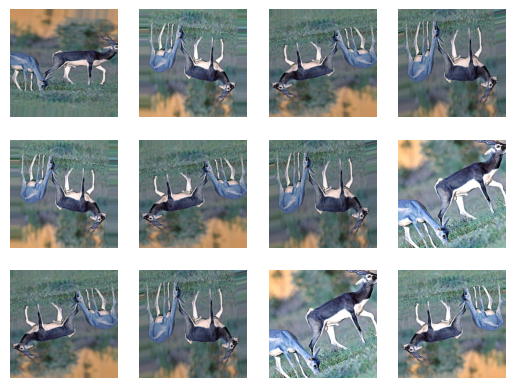

In [ ]:
import glob

def plot_aug_images():
  save_to_dir = path_train_test_val + 'preview'
  if os.path.exists(save_to_dir):
      shutil.rmtree(save_to_dir)
  os.makedirs(save_to_dir)

  img = load_img(train_path + '/non_plant/not_leaf (1).jpg')  # this is a PIL image
  x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
  x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

  # the .flow() command below generates batches of randomly transformed images
  # and saves the results to the `preview/` directory
  i = 0
  for batch in train_datagen.flow(x, batch_size=1,
                            save_to_dir=save_to_dir, save_format='jpg'):
      i += 1
      if i > 20:
          break  # otherwise the generator would loop indefinitely

  images = []
  for img in glob.glob(save_to_dir + "/*.jpg"):
      n = cv2.imread(img)
      images.append(n)

  f, axarr = plt.subplots(3,4)
  for i in range(3):
    for j in range(4):
      axarr[i, j].imshow(images[i+j])
      axarr[i, j].axis('off')


plot_aug_images()

Test dataset

In [ ]:
# Test dataset
test_datagen = ImageDataGenerator(rescale = 1./255)

test_generator = test_datagen.flow_from_directory(test_path,
                                                  target_size=(img_width, img_height),
                                                  color_mode="rgb",
                                                  batch_size=batch_size,
                                                  class_mode='binary')

# same way - val_dataset (diff folder)

Found 300 images belonging to 2 classes.


Seed value

In [ ]:
import tensorflow as tf

seed_value = 42
np.random.seed(seed_value)

# Set the seed for TensorFlow
tf.random.set_seed(seed_value)

Defining the Sequential model

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=input_shape))
model.add(keras.layers.Dense(32, activation="selu"))
model.add(keras.layers.Dense(64, activation="selu"))
model.add(keras.layers.Dense(1, activation="sigmoid"))

# with one layer
# incr no of neurons, instead of layers

Compiling the model

In [ ]:
import tensorflow as tf

model.compile(loss="binary_crossentropy",
              optimizer=tf.keras.optimizers.AdamW(),
              metrics=["accuracy"])

Callbacks and Early Stopping

In [ ]:
# save the weights and the model in directory
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

checkpoint = ModelCheckpoint(save_dir+'ann_ia_2_32.h5',
                             save_best_only = True,
                             verbose = 1)

early_stopping = keras.callbacks.EarlyStopping(patience=5,
                                               restore_best_weights=True)

# patience = 5

Tensorflow callback

In [ ]:
from keras.callbacks import TensorBoard

# Create a TensorBoard callback
log_dir = save_dir + "/my_logs/fit/ann_ia_64_16" # + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir)

Fitting the model onto the training dataset

In [ ]:
epochs = 1000

history = model.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    callbacks = [checkpoint, early_stopping, tensorboard_callback],
                    )

# Do not specify the batch_size if your data is in the form of datasets, generators,
# or keras.utils.Sequence instances (since they generate batches).

Epoch 1/1000
30/30 [==============================] - ETA: 0s - loss: 5.6405 - accuracy: 0.5760
Epoch 1: val_loss improved from inf to 2.43049, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann_ia_2_32.h5
30/30 [==============================] - 58s 2s/step - loss: 5.6405 - accuracy: 0.5760 - val_loss: 2.4305 - val_accuracy: 0.6375
Epoch 2/1000
30/30 [==============================] - ETA: 0s - loss: 1.1374 - accuracy: 0.7500
Epoch 2: val_loss improved from 2.43049 to 0.82904, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann_ia_2_32.h5
30/30 [==============================] - 51s 2s/step - loss: 1.1374 - accuracy: 0.7500 - val_loss: 0.8290 - val_accuracy: 0.8375
Epoch 3/1000
30/30 [==============================] - ETA: 0s - loss: 0.8050 - accuracy: 0.7854
Epoch 3: val_loss improved from 0.82904 to 0.44927, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann_ia_2_32.h5
30/30 [==============================] - 56s 2s/step - loss: 0.8050 - accuracy: 0.7

In [ ]:
# Rollback to the best performing model
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"
model = keras.models.load_model(save_dir + 'ann_ia_2_32.h5')

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 196608)            0         
                                                                 
 dense_9 (Dense)             (None, 32)                6291488   
                                                                 
 dense_10 (Dense)            (None, 64)                2112      
                                                                 
 dense_11 (Dense)            (None, 1)                 65        
                                                                 
Total params: 6,293,665
Trainable params: 6,293,665
Non-trainable params: 0
_________________________________________________________________


Model performance: Plotting the results

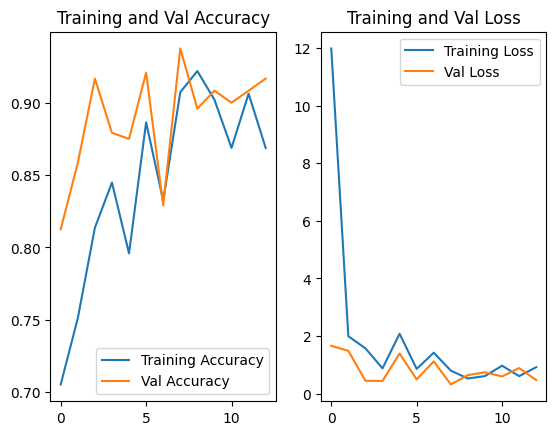

In [ ]:
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1)
plt.title('Training and Val Accuracy')
plt.plot(history.epoch, history.history['accuracy'], label='Training Accuracy')
plt.plot(history.epoch, history.history['val_accuracy'], label='Val Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.title('Training and Val Loss')
plt.plot(history.epoch, history.history['loss'], label='Training Loss')
plt.plot(history.epoch, history.history['val_loss'], label='Val Loss')
plt.legend()

plt.show()

Model Evaluation

In [ ]:
accuracy_score = model.evaluate(test_generator)

print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100))
print("Loss: ",accuracy_score[0])

10/10 [==============================] - 8s 837ms/step - loss: 0.2211 - accuracy: 0.9300
Accuracy: 93.0000%
Loss:  0.22110997140407562


Confusion Matrix (Training dataset)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_train_pred = model.predict(train_generator)

30/30 [==============================] - 39s 1s/step


In [ ]:
y_train_pred[3:7]

array([[0.08825406],
       [0.0263812 ],
       [0.8607999 ],
       [0.08645313]], dtype=float32)

In [ ]:
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')
y_train_pred[3:7]

array([[0],
       [0],
       [0],
       [1]], dtype=int32)

In [ ]:
train_generator.samples

960

In [ ]:
train_all_images = []
train_y_images_labels = []

for i in range(len(train_generator)):
  train_batch_images, train_batch_labels = next(train_generator)

  train_batch_images = np.array(train_batch_images)
  train_all_images.extend(train_batch_images)

  train_batch_labels = np.array(train_batch_labels)
  train_batch_labels = train_batch_labels.astype('int32')
  train_y_images_labels.extend(train_batch_labels)

train_all_images = np.array(train_all_images)

train_y_images_labels = np.array(train_y_images_labels)
train_y_images_labels = train_y_images_labels.astype('int32')

In [ ]:
len(train_all_images), len(train_y_images_labels), train_all_images.shape, train_y_images_labels.shape

(960, 960, (960, 256, 256, 3), (960,))

In [ ]:
y_train_pred = model.predict(train_all_images)
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')

30/30 [==============================] - 2s 81ms/step


Seaborn Heatmap - for training dataset


<Axes: >

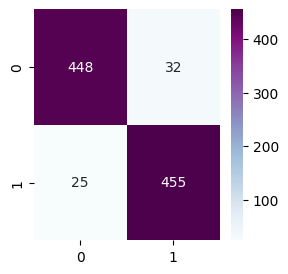

In [ ]:
cm = confusion_matrix(train_y_images_labels, y_train_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap - for training dataset")
sn.heatmap(df, annot=True, fmt='g', cmap="BuPu")

Confusion Matrix (Test dataset)

In [ ]:
test_generator.samples

300

In [ ]:
test_all_images = []
test_y_images_labels = []

for i in range(len(test_generator)):
  test_batch_images, test_batch_labels = next(test_generator)

  test_batch_images = np.array(test_batch_images)
  test_all_images.extend(test_batch_images)

  test_batch_labels = np.array(test_batch_labels)
  test_batch_labels = test_batch_labels.astype('int32')
  test_y_images_labels.extend(test_batch_labels)

test_all_images = np.array(test_all_images)

test_y_images_labels = np.array(test_y_images_labels)
test_y_images_labels = test_y_images_labels.astype('int32')

In [ ]:
len(test_all_images), len(test_y_images_labels), type(test_all_images), type(test_y_images_labels), test_all_images.shape, test_y_images_labels.shape

(300, 300, numpy.ndarray, numpy.ndarray, (300, 256, 256, 3), (300,))

In [ ]:
y_test_pred = model.predict(test_generator)
y_test_pred = y_test_pred > 0.5
y_test_pred = y_test_pred.astype('int32')

len(y_test_pred), len(test_generator)

10/10 [==============================] - 9s 808ms/step


(300, 10)

Seaborn Heatmap - for test dataset


<Axes: >

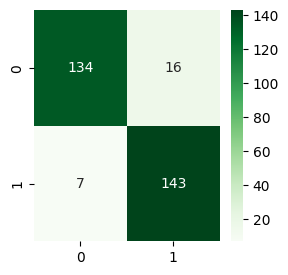

In [ ]:
cm = confusion_matrix(test_y_images_labels, y_test_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap - for test dataset")
sn.heatmap(df, annot=True, fmt='g', cmap="Greens")

Classification Report

In [ ]:
from sklearn.metrics import classification_report

test_generator.reset()
predictions = model.predict(test_generator, steps=len(test_generator))

y = np.argmax(predictions, axis=1)

print('Classification Report')
cr = classification_report(y_true=test_generator.classes, y_pred=y, target_names=test_generator.class_indices, zero_division=1)
print(cr)

10/10 [==============================] - 8s 833ms/step
Classification Report
              precision    recall  f1-score   support

   non_plant       0.50      1.00      0.67       150
       plant       1.00      0.00      0.00       150

    accuracy                           0.50       300
   macro avg       0.75      0.50      0.33       300
weighted avg       0.75      0.50      0.33       300



Performance Metrics on Training Set

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("On training dataset")
print("Precision score: ", precision_score(train_y_images_labels, y_train_pred))
print("Recall score: ", recall_score(train_y_images_labels, y_train_pred))
print("F1 score: ", f1_score(train_y_images_labels, y_train_pred))

On training dataset
Precision score:  0.9642857142857143
Recall score:  0.95625
F1 score:  0.9602510460251047


Performance Metrics on Test Set

In [ ]:
print("On test dataset")
print("Precision score: ", precision_score(test_y_images_labels, y_test_pred))
print("Recall score: ", recall_score(test_y_images_labels, y_test_pred))
print("F1 score: ", f1_score(test_y_images_labels, y_test_pred))

On test dataset
Precision score:  0.9539473684210527
Recall score:  0.9666666666666667
F1 score:  0.9602649006622516


Prediction on new images

In [ ]:
# Preds dataset
preds_path = "/content/drive/MyDrive/Dataset/leaves_SVM/preds_2classes"
preds_path_wo = "/content/drive/MyDrive/Dataset/leaves_SVM/preds_2classes_wo"

pred_datagen = ImageDataGenerator(rescale = 1./255)

pred_generator = pred_datagen.flow_from_directory(
                                                  # preds_path,
                                                  preds_path_wo,
                                                  target_size=(img_width, img_height),
                                                  color_mode="rgb",
                                                  batch_size=batch_size,
                                                  class_mode='binary')

In [ ]:
total = pred_generator.samples
total

In [ ]:
all_images = []
y_images_labels = []

for i in range(len(pred_generator)):
  batch_images, batch_labels = next(pred_generator)

  batch_images = np.array(batch_images)
  all_images.extend(batch_images)

  batch_labels = np.array(batch_labels)
  batch_labels = batch_labels.astype('int32')
  y_images_labels.extend(batch_labels)

all_images = np.array(all_images)

y_images_labels = np.array(y_images_labels)
y_images_labels = y_images_labels.astype('int32')

In [ ]:
len(all_images), len(y_images_labels), type(all_images), type(y_images_labels), all_images.shape, y_images_labels.shape

(107, 107, numpy.ndarray, numpy.ndarray, (107, 256, 256, 3), (107,))

In [ ]:
y_new_preds = model.predict(all_images)
y_new_preds = y_new_preds > 0.5
y_new_preds = y_new_preds.astype('int32')

In [ ]:
def predict_func():
  correct = 0
  batch_label_classes = ['Non-plant', 'Plant']

  for i in range(total):
    # Display the image using Matplotlib
    print("Image {0} / {1}: ".format(i+1, total))
    img = cv2.resize(all_images[i], (150, 150))
    plt.imshow(img)
    plt.axis('off')  # Remove axis labels
    plt.show()

    print("prediction: ", y_new_preds[i][0])
    print("prediction label: ", batch_label_classes[int(y_new_preds[i][0])])

    if y_images_labels[i] == y_new_preds[i][0]:
      print("CORRECT")
      correct += 1
    else:  print("WRONG!!")
    print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

WITH Confusing images

In [ ]:
predict_func()

WITHOUT confusing images

In [ ]:
predict_func()

In [ ]:
# tensorboard

##### Neural Net 2: WITHOUT Image Augmentation

In [ ]:
import cv2
import numpy as np
from sklearn import svm
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import array_to_img, img_to_array, load_img
from keras.callbacks import ModelCheckpoint

import os
import shutil

In [ ]:
# Define the image size
img_width, img_height = 256, 256
input_shape = (img_width, img_height, 3)

# Define the batch size for training
batch_size = 32

# batch_size = 16

Dataset: from above code lines

In [ ]:
from sklearn.model_selection import train_test_split

# split test from total - train + test
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.103, random_state=42)

# split val from train
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.1538, random_state=42)

Dimensions of Training, Test and Val dataset

In [ ]:
x_train.shape, x_test.shape, x_val.shape

((1100, 256, 256, 3), (150, 256, 256, 3), (200, 256, 256, 3))

Seed value

In [ ]:
import tensorflow as tf

seed_value = 42
np.random.seed(seed_value)

# Set the seed for TensorFlow
tf.random.set_seed(seed_value)

Defining the model

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=input_shape))
model.add(keras.layers.Dense(32, activation="selu"))
model.add(keras.layers.Dense(64, activation="selu"))
model.add(keras.layers.Dense(1, activation="sigmoid"))

# start with a single h layer. 32, 64 ...
# SELU

In [ ]:
import tensorflow as tf

model.compile(loss="binary_crossentropy",
              # optimizer="adam",
              optimizer=tf.keras.optimizers.AdamW(),
              metrics=["accuracy"])

# optimizer=AdamW. with default arguments
# no change in lr (default)

In [ ]:
# save the weights and the model in directory
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

checkpoint = ModelCheckpoint(save_dir + 'ann2_32.h5',
                            #  monitor = 'val_loss',
                             save_best_only = True,
                            #  save_weights_only = True,
                             verbose = 1)

early_stopping = keras.callbacks.EarlyStopping(patience=5,
                                               restore_best_weights=True)

# earlyStopping. patience = 5

In [ ]:
from keras.callbacks import TensorBoard

# Create a TensorBoard callback
log_dir = save_dir + "/my_logs/fit/ann2_32" # + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir)

In [ ]:
epochs = 1000

history = model.fit(x_train, y_train,
                    epochs=epochs,
                    validation_data=(x_val, y_val),
                    batch_size = batch_size,
                    callbacks=[checkpoint, early_stopping, tensorboard_callback])

Epoch 1/1000
35/35 [==============================] - ETA: 0s - loss: 4.5391 - accuracy: 0.5255
Epoch 1: val_loss improved from inf to 0.93162, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann2_32.h5
35/35 [==============================] - 8s 210ms/step - loss: 4.5391 - accuracy: 0.5255 - val_loss: 0.9316 - val_accuracy: 0.7300
Epoch 2/1000
35/35 [==============================] - ETA: 0s - loss: 0.8706 - accuracy: 0.7464
Epoch 2: val_loss improved from 0.93162 to 0.50702, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann2_32.h5
35/35 [==============================] - 5s 144ms/step - loss: 0.8706 - accuracy: 0.7464 - val_loss: 0.5070 - val_accuracy: 0.8050
Epoch 3/1000
35/35 [==============================] - ETA: 0s - loss: 0.4001 - accuracy: 0.8491
Epoch 3: val_loss improved from 0.50702 to 0.29648, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann2_32.h5
35/35 [==============================] - 8s 215ms/step - loss: 0.4001 - accuracy: 0.8491 - 

In [ ]:
# Roll back to the best model
model = keras.models.load_model(save_dir + 'ann2_32.h5')

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 196608)            0         
                                                                 
 dense_3 (Dense)             (None, 32)                6291488   
                                                                 
 dense_4 (Dense)             (None, 64)                2112      
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 6,293,665
Trainable params: 6,293,665
Non-trainable params: 0
_________________________________________________________________


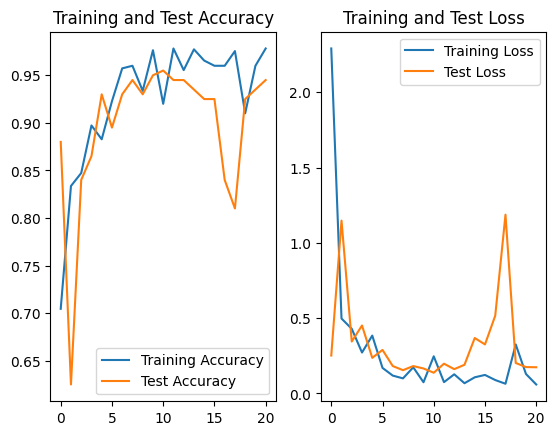

In [ ]:
plt.subplot(1, 2, 1)
plt.title('Training and Test Accuracy')
plt.plot(history.epoch, history.history['accuracy'], label='Training Accuracy')
plt.plot(history.epoch, history.history['val_accuracy'], label='Test Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.title('Training and Test Loss')
plt.plot(history.epoch, history.history['loss'], label='Training Loss')
plt.plot(history.epoch, history.history['val_loss'], label='Test Loss')
plt.legend()

plt.show()

# plot in the same chart

Model Evaluation

In [ ]:
accuracy_score = model.evaluate(x_test, y_test)

print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100))
print("Loss: ",accuracy_score[0])

# 3 data splits
# 550 - training
# 100 - valid
# 100 - test

5/5 [==============================] - 0s 13ms/step - loss: 0.6922 - accuracy: 0.5533
Accuracy: 55.3333%
Loss:  0.6921782493591309


Confusion matrix (training dataset)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_train_pred = model.predict(x_train)
y_train_pred[:5]

35/35 [==============================] - 1s 24ms/step


array([[8.5009080e-01],
       [1.1544552e-01],
       [5.4293976e-04],
       [9.9992782e-01],
       [1.0882112e-02]], dtype=float32)

In [ ]:
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')
y_train_pred[:5]

array([[1],
       [0],
       [0],
       [1],
       [0]], dtype=int32)

Seaborn Heatmap


<Axes: >

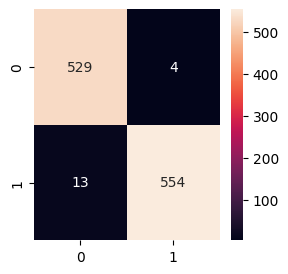

In [ ]:
cm = confusion_matrix(y_train, y_train_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap")
sn.heatmap(df, annot=True, fmt='g')

Confusion matrix (test dataset)

In [ ]:
y_test_pred = model.predict(x_test) > 0.5
y_test_pred = y_test_pred.astype('int32')

5/5 [==============================] - 0s 17ms/step


5/5 [==============================] - 0s 27ms/step
Seaborn Heatmap (Test dataset)


<Axes: >

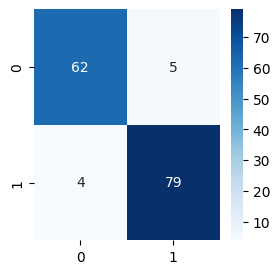

In [ ]:
cm = confusion_matrix(y_test, y_test_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap (Test dataset)")
sn.heatmap(df, annot=True, fmt='g', cmap='Blues')

Classification Report

In [ ]:
from sklearn.metrics import classification_report

print('Classification Report: ')
print(classification_report(y_test, y_test_pred))

Classification Report: 
              precision    recall  f1-score   support

           0       0.97      0.94      0.95        67
           1       0.95      0.98      0.96        83

    accuracy                           0.96       150
   macro avg       0.96      0.96      0.96       150
weighted avg       0.96      0.96      0.96       150



Performance metrics (Training dataset)

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("On training dataset")
print("Precision score: ", precision_score(y_train, y_train_pred, zero_division=0))
print("Recall score: ", recall_score(y_train, y_train_pred, zero_division=0))
print("F1 score: ", f1_score(y_train, y_train_pred, zero_division=0))

On training dataset
Precision score:  0.9704861111111112
Recall score:  0.9858906525573192
F1 score:  0.9781277340332459


Performance metrics (Test dataset)

In [ ]:
print("On test dataset")
print("Precision score: ", precision_score(y_test, y_test_pred, zero_division=0))
print("Recall score: ", recall_score(y_test, y_test_pred, zero_division=0))
print("F1 score: ", f1_score(y_test, y_test_pred, zero_division=0))

On test dataset
Precision score:  0.9010989010989011
Recall score:  0.9879518072289156
F1 score:  0.9425287356321839


Making predictions on new data

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = {
    # # with confusing images
    # # 6, 10, 11, 20
                'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

    # 3, 9, 25, 44, 57, 70, 87, 89
                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,

              # without confusing images
                # 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_7.png':1,
                # 'leaf_8.png':1, 'leaf_9.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                # 'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_21.png':1,
                # 'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                # 'leaf_29.png':1, 'leaf_30.png':1,

                # 'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                # 'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0,  'not_leaf_10.png':0,
                # 'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                # 'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                # 'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0,
                # 'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                # 'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                # 'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                # 'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_45.png':0,
                # 'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                # 'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                # 'not_leaf_56.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                # 'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                # 'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0,
                # 'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                # 'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                # 'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                # 'not_leaf_86.png':0, 'not_leaf_88.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = len(pred_files)  # in total = 89 + 30

In [ ]:
total

107

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func():
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = cv2.resize(img, (256, 256))  # Normalization portion
      print(type(img))
      img = img.astype('float32')
      img /= 255.0
      img = np.array([img])

  #     view_img = cv2.imread(file_name)
  #     view_img = cv2.resize(view_img, (150, 150))
  #     cv2_imshow(view_img)

  #     pred = model.predict(img) > 0.5
  #     pred = pred.astype('int32')[0][0]
  #     print("prediction: ", pred)
  #     print("prediction label: ", pred_labels[int(pred)])
  #     if pred_files[i] == pred:
  #       print("CORRECT")
  #       correct += 1
  #     else:  print("WRONG!")
  #     print()

  # print("\nCorrect predictions: {0} / {1}".format(correct, total))
  # print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  # print("Accuracy % = {:.2f}".format((correct * 100) / total))

In [ ]:
predict_func()

WITH Confusing Images

In [ ]:
print("-------NEURAL NETWORK MODEL-------:\n")
predict_func(model)

WITHOUT Confusing Images

In [ ]:
print("-------NEURAL NETWORK MODEL-------:\n")
predict_func(model)

#### Neural Network: CNN

In [ ]:
# Define the image size
img_width, img_height = 256, 256
input_shape = (img_width, img_height, 3)

# Define the batch size for training
# batch_size = 32

batch_size = 16

##### CNN1: WITH Image Augmentation

In [ ]:
import cv2
import numpy as np
from sklearn import svm
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import array_to_img, img_to_array, load_img
from keras.callbacks import ModelCheckpoint
from keras.layers import Conv2D, MaxPooling2D, Dropout, BatchNormalization, Flatten, Dense, AveragePooling2D

import os
import shutil

Loading the saved model

In [ ]:
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

model = keras.models.load_model(save_dir + "cnn_plants_gen.h5")
print("Model successfully loaded!")

model.summary()

Model successfully loaded!
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_1 (Batc 

Preparing the dataset: via Image Generator

In [ ]:
# Define the paths to the dataset
path_train_test_val = "/content/drive/MyDrive/Dataset/dataset750_split/"
train_path = path_train_test_val + 'train'
test_path = path_train_test_val + 'test'
val_path = path_train_test_val + 'val'

Training dataset

In [ ]:
# Data Augmentation
train_datagen = ImageDataGenerator(rotation_range=20,
                                   brightness_range=[0.4,1.5],
                                   rescale = 1./255,
                                   fill_mode='nearest'
                                   )

# Training data
train_generator = train_datagen.flow_from_directory(train_path,
                                                    target_size=(img_width, img_height),
                                                    color_mode="rgb",
                                                    batch_size=batch_size,
                                                    class_mode='binary',)

Found 960 images belonging to 2 classes.


Validation dataset

In [ ]:
val_datagen = ImageDataGenerator(rescale = 1./255,)

val_generator = val_datagen.flow_from_directory(val_path,
                                                target_size=(img_width, img_height),
                                                color_mode="rgb",
                                                batch_size=batch_size,
                                                class_mode='binary',)

Found 240 images belonging to 2 classes.


View augmented images

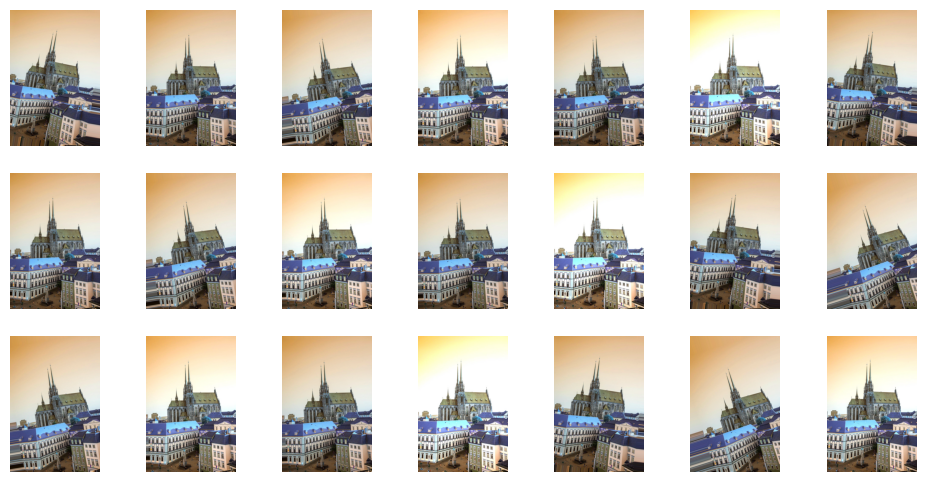

In [ ]:
import glob

def plot_aug_images():
  save_to_dir = path_train_test_val + 'preview'
  if os.path.exists(save_to_dir):
      shutil.rmtree(save_to_dir)
  os.makedirs(save_to_dir)

  img = load_img(train_path + '/non_plant/not_leaf (19).jpg')  # this is a PIL image
  x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
  x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

  # the .flow() command below generates batches of randomly transformed images
  # and saves the results to the `preview/` directory
  i = 0
  for batch in train_datagen.flow(x, batch_size=1,
                            save_to_dir=save_to_dir, save_format='jpg'):
      i += 1
      if i > 20:
          break  # otherwise the generator would loop indefinitely

  images = []
  for img in glob.glob(save_to_dir + "/*.jpg"):
      n = cv2.imread(img)
      images.append(n)

  f, axarr = plt.subplots(3, 7, figsize=(12, 6))
  for i in range(3):
    for j in range(7):
      axarr[i, j].imshow(images[i+j])
      axarr[i, j].axis('off')


plot_aug_images()

Test dataset

In [ ]:
# Test dataset
test_datagen = ImageDataGenerator(rescale = 1./255)

test_generator = test_datagen.flow_from_directory(test_path,
                                                  target_size=(img_width, img_height),
                                                  color_mode="rgb",
                                                  batch_size=batch_size,
                                                  class_mode='binary')


Found 300 images belonging to 2 classes.


Seed value

In [ ]:
import tensorflow as tf

seed_value = 42
np.random.seed(seed_value)

# Set the seed for TensorFlow
tf.random.set_seed(seed_value)

Defining the Sequential model

In [ ]:
# Define the model architecture
model = keras.models.Sequential()

# Add the first convolutional layer
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# Add the second convolutional layer
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# Flatten the output before passing it to the fully connected layers
model.add(Flatten())

# Add a fully connected layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Add the output layer
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_1 (Batc  (None, 125, 125, 64)     2

Compiling the model

In [ ]:
import tensorflow as tf

model.compile(loss="binary_crossentropy",
              optimizer=tf.keras.optimizers.AdamW(),
              metrics=["accuracy"])

Callbacks and Early Stopping

In [ ]:
from keras.callbacks import TensorBoard

# save the weights and the model in directory
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

checkpoint = ModelCheckpoint(save_dir+'cnn_ia_2_16.h5',
                             save_best_only = True,
                             verbose = 1)

early_stopping = keras.callbacks.EarlyStopping(patience=5,
                                               restore_best_weights=True)

Tensorboard callback

In [ ]:
# Create a TensorBoard callback
log_dir = save_dir + "/my_logs/fit/cnn_ia_32_32" # + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir)

Fitting the model onto the training dataset

In [ ]:
epochs = 1000

history = model.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    callbacks = [checkpoint, early_stopping, tensorboard_callback],
                    # verbose=1
                    )

# Do not specify the batch_size if your data is in the form of datasets, generators,
# or keras.utils.Sequence instances (since they generate batches).

Epoch 1/1000
30/30 [==============================] - ETA: 0s - loss: 0.3323 - accuracy: 0.8792
Epoch 1: val_loss improved from inf to 0.73353, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/cnn_ia_2_16.h5
30/30 [==============================] - 306s 10s/step - loss: 0.3323 - accuracy: 0.8792 - val_loss: 0.7335 - val_accuracy: 0.5042
Epoch 2/1000
30/30 [==============================] - ETA: 0s - loss: 0.1322 - accuracy: 0.9500
Epoch 2: val_loss did not improve from 0.73353
30/30 [==============================] - 218s 7s/step - loss: 0.1322 - accuracy: 0.9500 - val_loss: 0.8817 - val_accuracy: 0.5000
Epoch 3/1000
30/30 [==============================] - ETA: 0s - loss: 0.1066 - accuracy: 0.9615
Epoch 3: val_loss improved from 0.73353 to 0.72965, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/cnn_ia_2_16.h5
30/30 [==============================] - 223s 7s/step - loss: 0.1066 - accuracy: 0.9615 - val_loss: 0.7297 - val_accuracy: 0.5292
Epoch 4/1000
30/30 [========

In [ ]:
# Rollback to the best performing model
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"
model = keras.models.load_model(save_dir + 'cnn_ia_2_16.h5')

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 batch_normalization_1 (Batc  (None, 125, 125, 64)     2

Model performance: Plotting the results

In [ ]:
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1)
plt.title('Training and Val Accuracy')
plt.plot(history.epoch, history.history['accuracy'], label='Training Accuracy')
plt.plot(history.epoch, history.history['val_accuracy'], label='Val Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.title('Training and Val Loss')
plt.plot(history.epoch, history.history['loss'], label='Training Loss')
plt.plot(history.epoch, history.history['val_loss'], label='Val Loss')
plt.legend()

plt.show()

Model Evaluation

In [ ]:
accuracy_score = model.evaluate(test_generator)

print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100))
print("Loss: ",accuracy_score[0])

10/10 [==============================] - 6s 625ms/step - loss: 0.4756 - accuracy: 0.8300
Accuracy: 83.0000%
Loss:  0.4755643606185913


Confusion Matrix (Training dataset)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_train_pred = model.predict(train_generator)

30/30 [==============================] - 69s 2s/step


In [ ]:
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')
y_train_pred[3:7]

array([[1],
       [1],
       [1],
       [1]], dtype=int32)

In [ ]:
train_generator.samples

In [ ]:
train_all_images = []
train_y_images_labels = []

for i in range(len(train_generator)):
  train_batch_images, train_batch_labels = next(train_generator)

  train_batch_images = np.array(train_batch_images)
  train_all_images.extend(train_batch_images)

  train_batch_labels = np.array(train_batch_labels)
  train_batch_labels = train_batch_labels.astype('int32')
  train_y_images_labels.extend(train_batch_labels)

train_all_images = np.array(train_all_images)

train_y_images_labels = np.array(train_y_images_labels)
train_y_images_labels = train_y_images_labels.astype('int32')

In [ ]:
len(train_all_images), len(train_y_images_labels), train_all_images.shape, train_y_images_labels.shape

(960, 960, (960, 256, 256, 3), (960,))

In [ ]:
y_train_pred = model.predict(train_all_images)
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')

30/30 [==============================] - 36s 1s/step


Seaborn Heatmap - for training dataset


<Axes: >

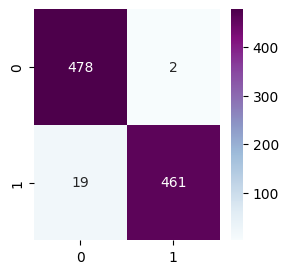

In [ ]:
cm = confusion_matrix(train_y_images_labels, y_train_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap - for training dataset")
sn.heatmap(df, annot=True, fmt='g', cmap="BuPu")

Confusion Matrix (Test dataset)

In [ ]:
test_generator.samples

In [ ]:
test_all_images = []
test_y_images_labels = []

for i in range(len(test_generator)):
  test_batch_images, test_batch_labels = next(test_generator)

  test_batch_images = np.array(test_batch_images)
  test_all_images.extend(test_batch_images)

  test_batch_labels = np.array(test_batch_labels)
  test_batch_labels = test_batch_labels.astype('int32')
  test_y_images_labels.extend(test_batch_labels)

test_all_images = np.array(test_all_images)

test_y_images_labels = np.array(test_y_images_labels)
test_y_images_labels = test_y_images_labels.astype('int32')

In [ ]:
len(test_all_images), len(test_y_images_labels), type(test_all_images), type(test_y_images_labels), test_all_images.shape, test_y_images_labels.shape

(300, 300, numpy.ndarray, numpy.ndarray, (300, 256, 256, 3), (300,))

In [ ]:
y_test_pred = model.predict(test_generator)
y_test_pred = y_test_pred > 0.5
y_test_pred = y_test_pred.astype('int32')

len(y_test_pred), len(test_generator)

10/10 [==============================] - 18s 2s/step


(300, 10)

Seaborn Heatmap - for test dataset


<Axes: >

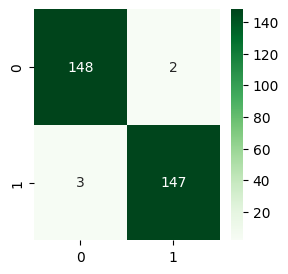

In [ ]:
cm = confusion_matrix(test_y_images_labels, y_test_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap - for test dataset")
sn.heatmap(df, annot=True, fmt='g', cmap="Greens")

Classification Report

In [ ]:
from sklearn.metrics import classification_report

test_generator.reset()
predictions = model.predict(test_generator, steps=len(test_generator))

y = np.argmax(predictions, axis=1)

print('Classification Report')
cr = classification_report(y_true=test_generator.classes, y_pred=y, target_names=test_generator.class_indices, zero_division=1)
print(cr)

19/19 [==============================] - 17s 876ms/step
Classification Report
              precision    recall  f1-score   support

   non_plant       0.50      1.00      0.67       150
       plant       1.00      0.00      0.00       150

    accuracy                           0.50       300
   macro avg       0.75      0.50      0.33       300
weighted avg       0.75      0.50      0.33       300



Performance Metrics on Training Set

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("On training dataset")
print("Precision score: ", precision_score(train_y_images_labels, y_train_pred))
print("Recall score: ", recall_score(train_y_images_labels, y_train_pred))
print("F1 score: ", f1_score(train_y_images_labels, y_train_pred))

On training dataset
Precision score:  0.636604774535809
Recall score:  1.0
F1 score:  0.7779578606158832


Performance Metrics on Test Set

In [ ]:
print("On test dataset")
print("Precision score: ", precision_score(test_y_images_labels, y_test_pred))
print("Recall score: ", recall_score(test_y_images_labels, y_test_pred))
print("F1 score: ", f1_score(test_y_images_labels, y_test_pred))

On test dataset
Precision score:  0.6437768240343348
Recall score:  1.0
F1 score:  0.7832898172323759


Prediction on new images

In [ ]:
# Preds dataset
preds_path = "/content/drive/MyDrive/Dataset/leaves_SVM/preds_2classes"
preds_path_wo = "/content/drive/MyDrive/Dataset/leaves_SVM/preds_2classes_wo"

pred_datagen = ImageDataGenerator(rescale = 1./255)

pred_generator = pred_datagen.flow_from_directory(
                                                  # preds_path,
                                                  preds_path_wo,
                                                  target_size=(img_width, img_height),
                                                  color_mode="rgb",
                                                  batch_size=batch_size,
                                                  class_mode='binary')

Found 107 images belonging to 2 classes.


In [ ]:
total = pred_generator.samples
total

107

In [ ]:
all_images = []
y_images_labels = []

for i in range(len(pred_generator)):
  batch_images, batch_labels = next(pred_generator)

  batch_images = np.array(batch_images)
  all_images.extend(batch_images)

  batch_labels = np.array(batch_labels)
  batch_labels = batch_labels.astype('int32')
  y_images_labels.extend(batch_labels)

all_images = np.array(all_images)

y_images_labels = np.array(y_images_labels)
y_images_labels = y_images_labels.astype('int32')

In [ ]:
len(all_images), len(y_images_labels), type(all_images), type(y_images_labels), all_images.shape, y_images_labels.shape

(119, 119, numpy.ndarray, numpy.ndarray, (119, 256, 256, 3), (119,))

In [ ]:
y_new_preds = model.predict(all_images)
y_new_preds = y_new_preds > 0.5
y_new_preds = y_new_preds.astype('int32')

4/4 [==============================] - 0s 22ms/step


In [ ]:
def predict_func():
  correct = 0
  batch_label_classes = ['Non-plant', 'Plant']

  for i in range(total):
    # Display the image using Matplotlib
    print("Image {0} / {1}: ".format(i+1, total))
    img = cv2.resize(all_images[i], (150, 150))
    plt.imshow(img)
    plt.axis('off')  # Remove axis labels
    plt.show()

    print("prediction: ", y_new_preds[i][0])
    print("prediction label: ", batch_label_classes[int(y_new_preds[i][0])])

    if y_images_labels[i] == y_new_preds[i][0]:
      print("CORRECT")
      correct += 1
    else:  print("WRONG!!")
    print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

WITH Confusing images

In [ ]:
predict_func()

WITHOUT confusing images

In [ ]:
predict_func()

##### CNN2: WITHOUT Image Augmentation

In [ ]:
import cv2
import numpy as np
from sklearn import svm
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import array_to_img, img_to_array, load_img
from keras.callbacks import ModelCheckpoint
from keras.layers import Conv2D, MaxPooling2D, Dropout, BatchNormalization, Flatten, Dense, AveragePooling2D

import os
import shutil

Load the saved model

In [ ]:
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

model = keras.models.load_model(save_dir + "cnn_plants.h5")
print("Model successfully loaded!")

model.summary()

Dataset splitting: Train, Val, Test

In [ ]:
from sklearn.model_selection import train_test_split

# split test from total - train + test
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.103, random_state=42)

# split val from train
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.1538, random_state=42)

In [ ]:
x_train.shape, x_test.shape, x_val.shape

((1100, 256, 256, 3), (150, 256, 256, 3), (200, 256, 256, 3))

In [ ]:
y_train.shape, y_test.shape, y_val.shape

((1100,), (150,), (200,))

Set the seed value before building the model

In [ ]:
import tensorflow as tf

seed_value = 42
np.random.seed(seed_value)

# Set the seed for TensorFlow
tf.random.set_seed(seed_value)

Defining the Model

In [ ]:
# Define the model architecture
model = keras.models.Sequential()

# Add the first convolutional layer
model.add(Conv2D(64, (3, 3), activation='relu', input_shape=input_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# # Add the second convolutional layer
# model.add(Conv2D(64, (3, 3), activation='relu'))
# model.add(BatchNormalization())
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.25))

# Flatten the output before passing it to the fully connected layers
model.add(Flatten())

# Add a fully connected layer
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Add the output layer
model.add(Dense(1, activation='sigmoid'))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 64)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 64)      0         
                                                                 
 flatten (Flatten)           (None, 1032256)           0         
                                                                 
 dense (Dense)               (None, 128)               1

In [ ]:
import tensorflow as tf

model.compile(loss="binary_crossentropy",
              optimizer=tf.keras.optimizers.AdamW(),
              metrics=["accuracy"])

In [ ]:
from keras.callbacks import TensorBoard
import datetime

# save the weights and the model in directory
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

checkpoint = ModelCheckpoint(save_dir+'cnn_plants2.h5',
                             save_best_only = True,
                             verbose = 1)

early_stopping = keras.callbacks.EarlyStopping(patience=5,
                                               restore_best_weights=True)

!!! change log file name

Defining Tensorboard callbacks

In [ ]:
# Create a TensorBoard callback
log_dir = save_dir + "/my_logs/fit/cnn64_16" # + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir)

In [ ]:
# Load tensorboard
%load_ext tensorboard

In [ ]:
!lsof -i :6008

In [ ]:
!kill 29436

In [ ]:
epochs = 1000

history = model.fit(x_train, y_train,
                    epochs=epochs,
                    validation_data=(x_val, y_val),
                    batch_size = batch_size,
                    callbacks=[checkpoint, early_stopping, tensorboard_callback])

Epoch 1/1000
69/69 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8855
Epoch 1: val_loss improved from inf to 0.70229, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/cnn_plants2.h5
69/69 [==============================] - 81s 1s/step - loss: 0.2766 - accuracy: 0.8855 - val_loss: 0.7023 - val_accuracy: 0.5000
Epoch 2/1000
69/69 [==============================] - ETA: 0s - loss: 0.1495 - accuracy: 0.9436
Epoch 2: val_loss improved from 0.70229 to 0.63758, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/cnn_plants2.h5
69/69 [==============================] - 24s 350ms/step - loss: 0.1495 - accuracy: 0.9436 - val_loss: 0.6376 - val_accuracy: 0.5300
Epoch 3/1000
69/69 [==============================] - ETA: 0s - loss: 0.1178 - accuracy: 0.9618
Epoch 3: val_loss did not improve from 0.63758
69/69 [==============================] - 10s 141ms/step - loss: 0.1178 - accuracy: 0.9618 - val_loss: 0.6377 - val_accuracy: 0.5450
Epoch 4/1000
69/69 [======

In [ ]:
# !kill 1547

In [ ]:
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

log_dir_all_files = save_dir + "my_logs/fit/20230608-070246/"

In [ ]:
import tensorflow

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir log_dir_all_files --port=6007

<IPython.core.display.Javascript object>

In [ ]:
%tensorboard --inspect --logdir log_dir_all_files

ERROR: Failed to launch TensorBoard (exited with 0).
Contents of stderr:
2023-06-12 06:36:46.289166: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Contents of stdout:
Processing event files... (this can take a few minutes)

No event files found within logdir log_dir_all_files

In [ ]:
log_dir_all_files

'/content/drive/MyDrive/Dataset/leaves_SVM/my_logs/fit/20230608-070246/'

Model rollback

In [ ]:
# Rollback to the best performing model
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"
model = keras.models.load_model(save_dir + 'cnn_plants2.h5')

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 64)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 127, 127, 64)      0         
                                                                 
 flatten (Flatten)           (None, 1032256)           0         
                                                                 
 dense (Dense)               (None, 128)               1

In [ ]:
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1)
plt.title('Training and Val Accuracy')
plt.plot(history.epoch, history.history['accuracy'], label='Training Accuracy')
plt.plot(history.epoch, history.history['val_accuracy'], label='Val Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.title('Training and Val Loss')
plt.plot(history.epoch, history.history['loss'], label='Training Loss')
plt.plot(history.epoch, history.history['val_loss'], label='Val Loss')
plt.legend()

plt.show()

Model Evaluation

In [ ]:
accuracy_score = model.evaluate(x_test, y_test)

print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100))
print("Loss: ",accuracy_score[0])

5/5 [==============================] - 1s 67ms/step - loss: 0.0716 - accuracy: 0.9733
Accuracy: 97.3333%
Loss:  0.07160233706235886


Confusion Matrix (Train dataset)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_train_pred = model.predict(x_train)

35/35 [==============================] - 1s 28ms/step


In [ ]:
y_train_pred[3:7]

array([[0.78689754],
       [0.41405284],
       [0.1416311 ],
       [0.12153235]], dtype=float32)

In [ ]:
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')
y_train_pred[3:7]

array([[1],
       [0],
       [0],
       [0]], dtype=int32)

Seaborn Heatmap - for training dataset


<Axes: >

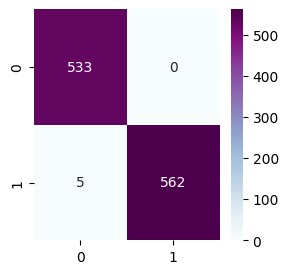

In [ ]:
cm = confusion_matrix(y_train, y_train_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap - for training dataset")
sn.heatmap(df, annot=True, fmt='g', cmap="BuPu")

Confusion Matrix (Test dataset)

In [ ]:
y_test_pred = model.predict(x_test)
y_test_pred = y_test_pred > 0.5
y_test_pred = y_test_pred.astype('int32')

5/5 [==============================] - 0s 26ms/step


Seaborn Heatmap - for test dataset


<Axes: >

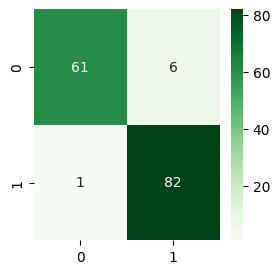

In [ ]:
cm = confusion_matrix(y_test, y_test_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap - for test dataset")
sn.heatmap(df, annot=True, fmt='g', cmap="Greens")

Classification Report

In [ ]:
from sklearn.metrics import classification_report

print('Classification Report')
print(classification_report(y_test, y_test_pred))

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.91      0.95        67
           1       0.93      0.99      0.96        83

    accuracy                           0.95       150
   macro avg       0.96      0.95      0.95       150
weighted avg       0.96      0.95      0.95       150



Performance Metrics on Training Dataset

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("On training dataset")
print("Precision score: ", precision_score(y_train, y_train_pred))
print("Recall score: ", recall_score(y_train, y_train_pred))
print("F1 score: ", f1_score(y_train, y_train_pred))

On training dataset
Precision score:  1.0
Recall score:  1.0
F1 score:  1.0


Performance Metrics on Test Dataset

In [ ]:
print("On test dataset")
print("Precision score: ", precision_score(y_test, y_test_pred))
print("Recall score: ", recall_score(y_test, y_test_pred))
print("F1 score: ", f1_score(y_test, y_test_pred))

On test dataset
Precision score:  0.9759036144578314
Recall score:  0.9759036144578314
F1 score:  0.9759036144578314


Making predictions on unseen images

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = {
                # with confusing images
                # # 6, 10, 11, 20
                # 'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                # 'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                # 'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                # 'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                # 'leaf_29.png':1, 'leaf_30.png':1,

                # # 3, 9, 25, 44, 57, 70, 87, 89
                # 'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                # 'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                # 'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                # 'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                # 'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                # 'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                # 'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                # 'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                # 'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                # 'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                # 'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                # 'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                # 'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                # 'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                # 'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                # 'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                # 'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                # 'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,

              # without confusing images
                'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0,  'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_88.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = len(pred_files)  # in total = 89 + 30

In [ ]:
total

119

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      # print("Image {0} / {1} : ".format(str(i)+1, str(total)))
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = cv2.resize(img, (256, 256))  # Normalization portion
      img = img.astype('float32')
      img /= 255.0
      img = np.array([img])

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      pred = model.predict(img) > 0.5
      pred = pred.astype('int32')[0][0]
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

WITH Confusing Images

In [ ]:
predict_func(model)

WITHOUT Confusing Images

In [ ]:
predict_func(model)